## Import libraries

In [ ]:
import numpy as np
import awkward as ak
import uproot
import vector
vector.register_awkward()

#import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors

import os
#import shutil
#import zipfile
#import tarfile
#import urllib
import requests
from tqdm import tqdm

import time

# Exploratory Data Analysis

In [ ]:
def _download(url, fname, chunk_size=4096):
    '''https://gist.github.com/yanqd0/c13ed29e29432e3cf3e7c38467f42f51'''
    resp = requests.get(url, stream=True)
    total = int(resp.headers.get('content-length', 0))
    with open(fname, 'wb') as file, tqdm(
        desc=fname,
        total=total,
        unit='iB',
        unit_scale=True,
        unit_divisor=1024,
    ) as bar:
        for data in resp.iter_content(chunk_size=chunk_size):
            size = file.write(data)
            bar.update(size)

In [ ]:
# Download the example file
example_file = 'JetClass_example_100k.root'
if not os.path.exists(example_file):
    _download('https://hqu.web.cern.ch/datasets/JetClass/example/JetClass_example_100k.root', example_file)

## Exploring the file

In [ ]:
# Load the content from the file
tree = uproot.open(example_file)['tree']

In [ ]:
# Display the content of the "tree"
tree.show()

name                 | typename                 | interpretation                
---------------------+--------------------------+-------------------------------
part_px              | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_py              | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_pz              | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_energy          | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_deta            | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_dphi            | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_d0val           | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_d0err           | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_dzval           | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_dzerr           | std::vector<float>       | AsJagged(AsDtype('>f4'), he...
part_charge          | std::

In [ ]:
tree.num_entries 

100000

In [ ]:
# Load all arrays in the tree
# Each array is a column of the table
table = tree.arrays()

In [ ]:
table.show()

[{part_px: [-125, -91.1, ..., -1.14], part_py: [64.3, ...], part_pz: ..., ...},
 {part_px: [110, 27.9, ..., -0.189, 0.225], part_py: [219, ...], ...},
 {part_px: [129, 81.7, ..., 0.771, 0.616], part_py: [-63, ...], ...},
 {part_px: [91.2, 83.4, ..., 1.04, 0.698], part_py: [-128, ...], ...},
 {part_px: [-168, -52.9, ..., -0.473], part_py: [159, ...], part_pz: ..., ...},
 {part_px: [210, 145, ..., 0.976, 0.738], part_py: [...], part_pz: [...], ...},
 {part_px: [24.4, 36, ..., 0.633, 0.747], part_py: [63.8, ...], ...},
 {part_px: [-53.2, -45.9, ..., -0.674], part_py: [66, ...], part_pz: ..., ...},
 {part_px: [47.9, 40.8, ..., 1.14, 0.859], part_py: [...], part_pz: [...], ...},
 {part_px: [-49.4, -15.8, ..., -0.983], part_py: [-274, ...], ...},
 ...,
 {part_px: [-214, -138, ..., -1.71, -1.43], part_py: [...], part_pz: ..., ...},
 {part_px: [6.1, 3.21, ..., -0.0376], part_py: [155, ...], part_pz: [...], ...},
 {part_px: [-70.7, -54.7, ..., -0.442], part_py: [-78, ...], part_pz: ..., ...},
 

In [ ]:
type(table[0])

awkward.highlevel.Record

In [ ]:
type(table)

awkward.highlevel.Array

In [ ]:
# Each element in table is a jet
len(table)

100000

In [ ]:
table[0]

<Record {part_px: [-125, ...], ...} type='{part_px: var * float32, part_py:...'>

In [ ]:
# Number of particles in the jet
len(table[0]['part_px']), len(table[0]['part_py']), len(table[0]['part_pz'])

(38, 38, 38)

In [ ]:
# Number of particles must be consistent in all measures
len(table[0]['part_deta']), len(table[0]['part_dphi'])

(38, 38)

In [ ]:
table[0]['jet_nparticles']

38.0

In [ ]:
'''    
    jet_pt: float32,
    jet_eta: float32,
    jet_phi: float32,
    jet_energy: float32,
    jet_nparticles: float32,
    jet_sdmass: float32,
    jet_tau1: float32,
    jet_tau2: float32,
    jet_tau3: float32,
    jet_tau4: float32,
    aux_genpart_eta: float32,
    aux_genpart_phi: float32,
    aux_genpart_pid: float32,
    aux_genpart_pt: float32,
    aux_truth_match: float32
'''
table[0]['aux_genpart_pid']

25.0

table contiene 100000 registros, cada registro es un jet. 
Cada jet tiene unas features o información que lo caracteriza. Cada jet tiene un número diferente de partículas. 

En el caso del primer jet table[0], contiene 38 partículas y cada partícula tiene información de momento espacial por lo que 

len(table[0]['part_px']) = len(table[0]['part_py']) = len(table[0]['part_pz']) = table[0]['jet_nparticles'] = 38

In [ ]:
len(table)

100000

## Define labels field

In [262]:
table[0][[ 'label_H4q',
           'label_Hbb',
           'label_Hcc',
           'label_Hgg',
           'label_Hqql',
           'label_QCD',
           'label_Tbl',
           'label_Tbqq',
           'label_Wqq',
           'label_Zqq']].tolist()

{'label_H4q': False,
 'label_Hbb': True,
 'label_Hcc': False,
 'label_Hgg': False,
 'label_Hqql': False,
 'label_QCD': 0.0,
 'label_Tbl': 0,
 'label_Tbqq': 0,
 'label_Wqq': 0,
 'label_Zqq': 0}

In [ ]:
start_time = time.time()
labels_list = []
for i in range(len(table)):

    dict_labels = table[i][[ 'label_H4q',
                             'label_Hbb',
                             'label_Hcc',
                             'label_Hgg',
                             'label_Hqql',
                             'label_QCD',
                             'label_Tbl',
                             'label_Tbqq',
                             'label_Wqq',
                             'label_Zqq']].tolist()

    for clave in dict_labels:
        # Convierte el valor actual a entero
        dict_labels[clave] = int(dict_labels[clave])

    clave_maxima = max(dict_labels, key=lambda k: dict_labels[k])
    
    labels_list.append(clave_maxima)
    
print('Done!')
print('Execution time: {} seconds'.format(time.time() - start_time))

KeyboardInterrupt: 

In [ ]:
list(np.unique(labels_list))

['label_H4q',
 'label_Hbb',
 'label_Hcc',
 'label_Hgg',
 'label_Hqql',
 'label_QCD',
 'label_Tbl',
 'label_Tbqq',
 'label_Wqq',
 'label_Zqq']

In [ ]:
len(labels_list)

100000

In [ ]:
table['labels'] = labels_list

In [ ]:
table['labels'] 

<Array ['label_Hbb', 'label_Hbb', ..., 'label_Zqq'] type='100000 * string'>

In [ ]:
table.fields

['part_px',
 'part_py',
 'part_pz',
 'part_energy',
 'part_deta',
 'part_dphi',
 'part_d0val',
 'part_d0err',
 'part_dzval',
 'part_dzerr',
 'part_charge',
 'part_isChargedHadron',
 'part_isNeutralHadron',
 'part_isPhoton',
 'part_isElectron',
 'part_isMuon',
 'label_QCD',
 'label_Hbb',
 'label_Hcc',
 'label_Hgg',
 'label_H4q',
 'label_Hqql',
 'label_Zqq',
 'label_Wqq',
 'label_Tbqq',
 'label_Tbl',
 'jet_pt',
 'jet_eta',
 'jet_phi',
 'jet_energy',
 'jet_nparticles',
 'jet_sdmass',
 'jet_tau1',
 'jet_tau2',
 'jet_tau3',
 'jet_tau4',
 'aux_genpart_eta',
 'aux_genpart_phi',
 'aux_genpart_pid',
 'aux_genpart_pt',
 'aux_truth_match',
 'labels']

## Create plot functions

In [ ]:
# Graficar para cada etiqueta en un subgráfico separado
unique_labels = list(np.unique(labels_list))

In [ ]:
unique_labels

['label_H4q',
 'label_Hbb',
 'label_Hcc',
 'label_Hgg',
 'label_Hqql',
 'label_QCD',
 'label_Tbl',
 'label_Tbqq',
 'label_Wqq',
 'label_Zqq']

In [ ]:
type(table['labels'])

awkward.highlevel.Array

### Plot histograms separately

In [ ]:
def plot_histograms(input_features):

    # Obtener las variables relevantes
    part_feat= table[input_features]
    labels = table["labels"] ## Must be in type awkward.highlevel.Array

    num_subplots = len(unique_labels)
    fig, axs = plt.subplots(num_subplots, figsize=(5, 3*num_subplots))

    for i, label in enumerate(unique_labels):
        mask = labels == label
        axs[i].hist(part_feat[mask], bins=100 )
        axs[i].set_xlabel('{}'.format(input_features))
        axs[i].set_ylabel('count')
        axs[i].set_title(f'{input_features} histogram for {label}')
        axs[i].legend([label])

    plt.tight_layout()
    plt.show()

In [ ]:
#plot_histograms("jet_energy")

### Plot histograms for comparison

In [ ]:
def hist_feature_comparison(feature, path_file):

    jet_feat = table[feature]
    labels = table["labels"]
    
    for i, label in enumerate(unique_labels):
        mask = labels == label
        print(len(jet_feat[mask]))
        plt.hist(jet_feat[mask], bins=100 , alpha = 0.5, label = {label} )

    plt.xlabel('{}'.format(feature))
    plt.ylabel('count')
    plt.title('Histogram of {}'.format(feature))
    plt.legend()

    plt.tight_layout()
    plt.savefig(path_file + f'{feature}_plot.png')
    plt.show()

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


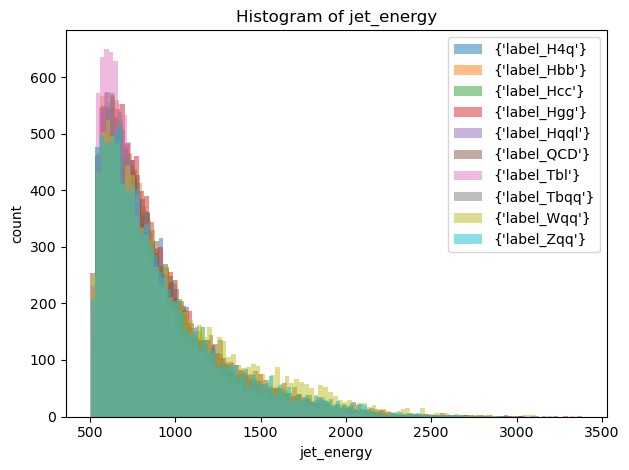

In [ ]:
path_file = os.getcwd() + os.sep + 'EDA_plots' + os.sep
hist_feature_comparison('jet_energy', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


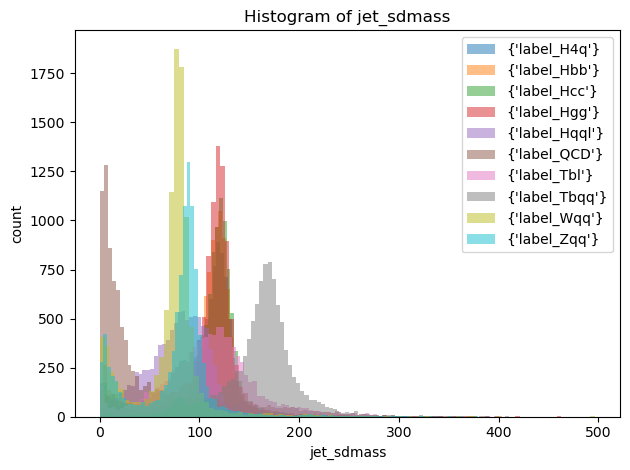

In [ ]:
hist_feature_comparison('jet_sdmass', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


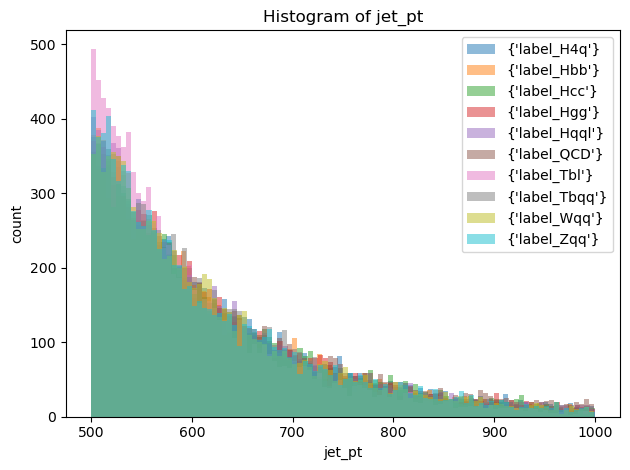

In [ ]:
hist_feature_comparison('jet_pt', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


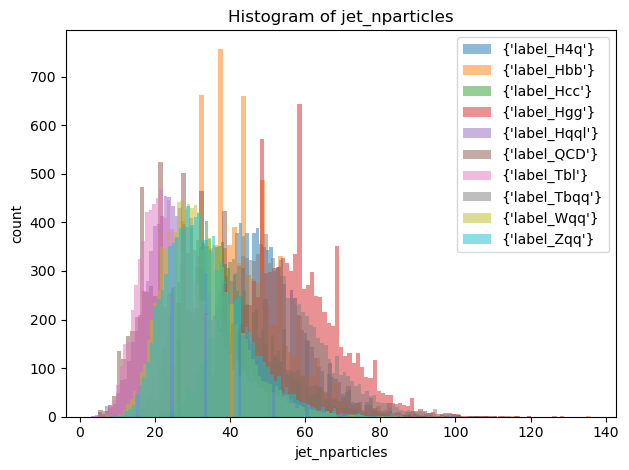

In [ ]:
hist_feature_comparison('jet_nparticles', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


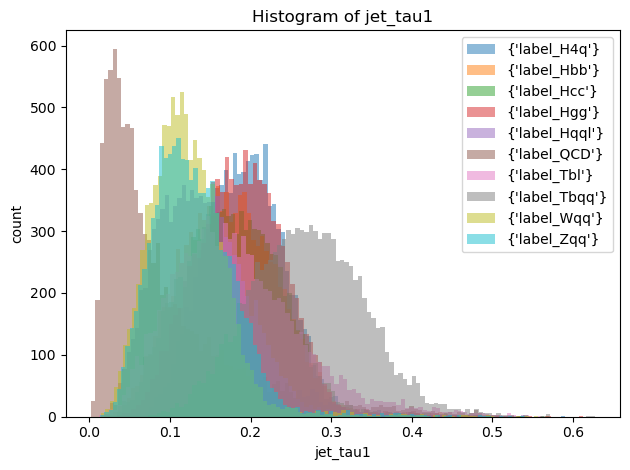

In [ ]:
hist_feature_comparison('jet_tau1', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


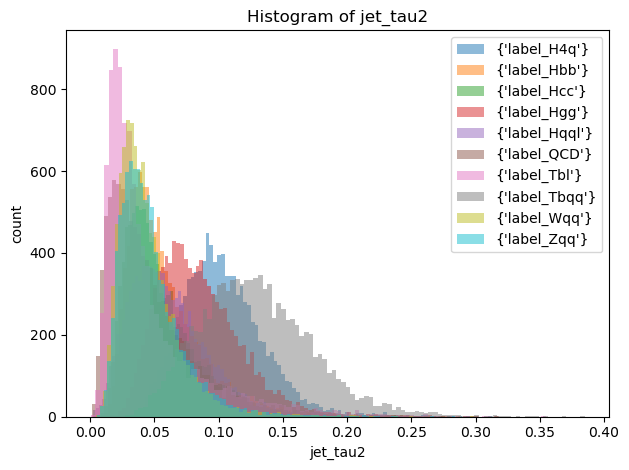

In [ ]:
hist_feature_comparison('jet_tau2', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


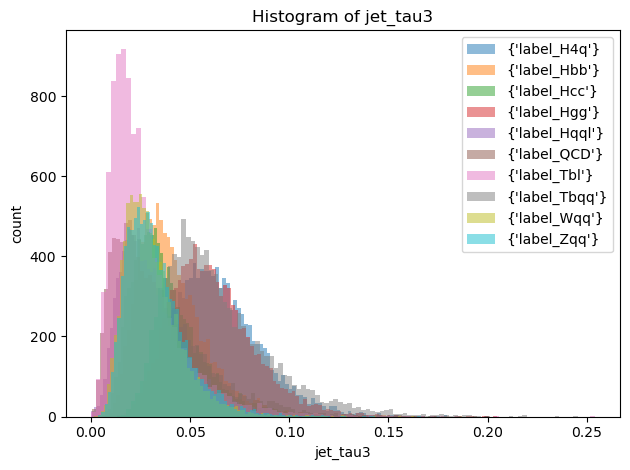

In [ ]:
hist_feature_comparison('jet_tau3', path_file)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


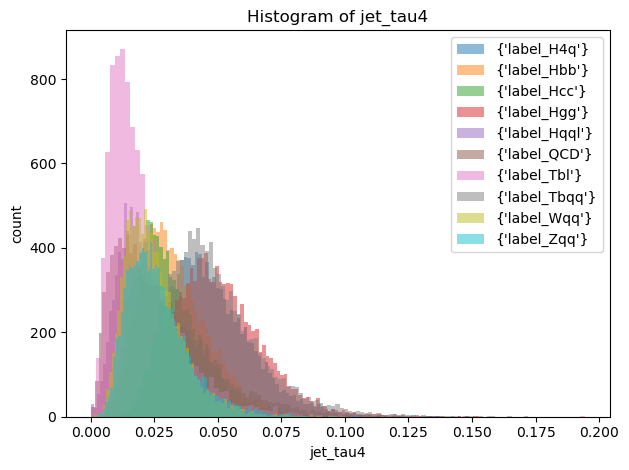

In [ ]:
hist_feature_comparison('jet_tau4', path_file)

In [ ]:
def hist_feature_comparison_subplots_advanced(features_list, path_file, bins=100, alpha=0.5, rows = 2, cols = 4):
    """
    Genera histogramas con opciones personalizables
    """
    labels = table["labels"]
    unique_labels = np.unique(labels)
    
    # Crear figura con subplots 2x4
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()
    
    # Colores para las etiquetas
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for i, feature in enumerate(features_list):
        if i >= 8:
            break
            
        ax = axes[i]
        jet_feat = table[feature]
        
        for j, label in enumerate(unique_labels):
            mask = labels == label
            count = len(jet_feat[mask])
            print(f"{feature} - {label}: {count} eventos")
            ax.hist(jet_feat[mask], bins=bins, alpha=alpha, 
                   label=str(label), color=colors[j])
        
        ax.set_xlabel(feature)
        ax.set_ylabel('count')
        ax.set_title(f'Histogram of {feature}')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Rotar etiquetas del eje x si son muy largas
        if len(feature) > 10:
            ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.savefig(f"{path_file}/all_features_hist_subplots_advanced.png", 
                dpi=300, bbox_inches='tight')

    plt.show()

    print(f'Plot saved in {path_file}')



jet_energy - label_H4q: 10000 eventos
jet_energy - label_Hbb: 10000 eventos
jet_energy - label_Hcc: 10000 eventos
jet_energy - label_Hgg: 10000 eventos
jet_energy - label_Hqql: 10000 eventos
jet_energy - label_QCD: 10000 eventos
jet_energy - label_Tbl: 10000 eventos
jet_energy - label_Tbqq: 10000 eventos
jet_energy - label_Wqq: 10000 eventos
jet_energy - label_Zqq: 10000 eventos
jet_sdmass - label_H4q: 10000 eventos
jet_sdmass - label_Hbb: 10000 eventos
jet_sdmass - label_Hcc: 10000 eventos
jet_sdmass - label_Hgg: 10000 eventos
jet_sdmass - label_Hqql: 10000 eventos
jet_sdmass - label_QCD: 10000 eventos
jet_sdmass - label_Tbl: 10000 eventos
jet_sdmass - label_Tbqq: 10000 eventos
jet_sdmass - label_Wqq: 10000 eventos
jet_sdmass - label_Zqq: 10000 eventos
jet_pt - label_H4q: 10000 eventos
jet_pt - label_Hbb: 10000 eventos
jet_pt - label_Hcc: 10000 eventos
jet_pt - label_Hgg: 10000 eventos
jet_pt - label_Hqql: 10000 eventos
jet_pt - label_QCD: 10000 eventos
jet_pt - label_Tbl: 10000 event

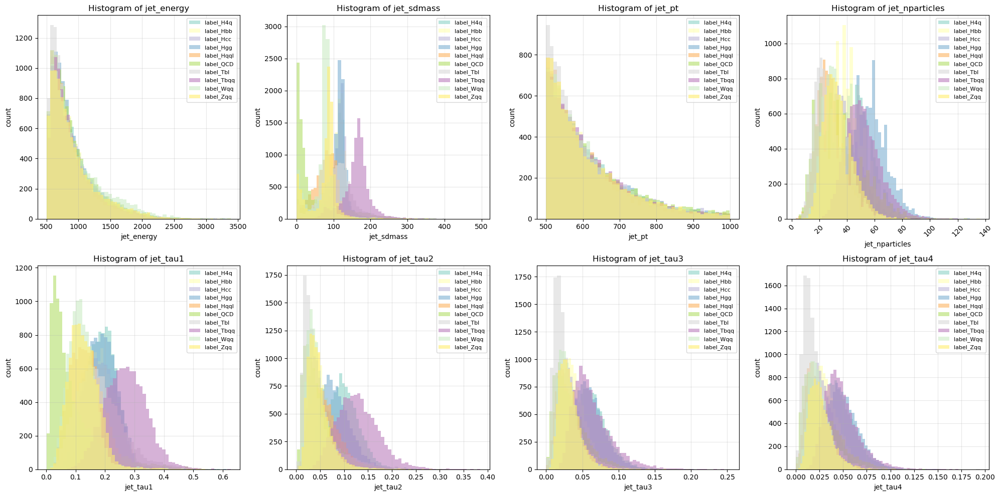

Plot saved in /home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots/


In [ ]:
# Lista de features de jet
jet_features = ['jet_energy', 'jet_sdmass', 'jet_pt', 'jet_nparticles', 
                'jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4']

# Llamar la función con parámetros personalizados
hist_feature_comparison_subplots_advanced(jet_features, path_file, bins=50, alpha=0.6, rows = 2, cols = 4)

In [ ]:
table['jet_tau21'] = table['jet_tau2']/table['jet_tau1']

In [ ]:
table['jet_tau32'] =  table['jet_tau3']/table['jet_tau2']

In [ ]:
table['jet_tau31'] =  table['jet_tau3']/table['jet_tau1']

table['jet_tau41'] =  table['jet_tau4']/table['jet_tau1']

table['jet_tau42'] =  table['jet_tau4']/table['jet_tau2']

table['jet_tau43'] =  table['jet_tau4']/table['jet_tau3']

/home/catalinariano/anaconda3/envs/part-tesis-11/lib/python3.11/site-packages/awkward/_nplikes/array_module.py:245: RuntimeWarning: invalid value encountered in divide
  return impl(*broadcasted_args, **(kwargs or {}))


In [ ]:
path_file

'/home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots/'

jet_tau21 - label_H4q: 10000 eventos
jet_tau21 - label_Hbb: 10000 eventos
jet_tau21 - label_Hcc: 10000 eventos
jet_tau21 - label_Hgg: 10000 eventos
jet_tau21 - label_Hqql: 10000 eventos
jet_tau21 - label_QCD: 10000 eventos
jet_tau21 - label_Tbl: 10000 eventos
jet_tau21 - label_Tbqq: 10000 eventos
jet_tau21 - label_Wqq: 10000 eventos
jet_tau21 - label_Zqq: 10000 eventos
jet_tau32 - label_H4q: 10000 eventos
jet_tau32 - label_Hbb: 10000 eventos
jet_tau32 - label_Hcc: 10000 eventos
jet_tau32 - label_Hgg: 10000 eventos
jet_tau32 - label_Hqql: 10000 eventos
jet_tau32 - label_QCD: 10000 eventos
jet_tau32 - label_Tbl: 10000 eventos
jet_tau32 - label_Tbqq: 10000 eventos
jet_tau32 - label_Wqq: 10000 eventos
jet_tau32 - label_Zqq: 10000 eventos
jet_tau31 - label_H4q: 10000 eventos
jet_tau31 - label_Hbb: 10000 eventos
jet_tau31 - label_Hcc: 10000 eventos
jet_tau31 - label_Hgg: 10000 eventos
jet_tau31 - label_Hqql: 10000 eventos
jet_tau31 - label_QCD: 10000 eventos
jet_tau31 - label_Tbl: 10000 even

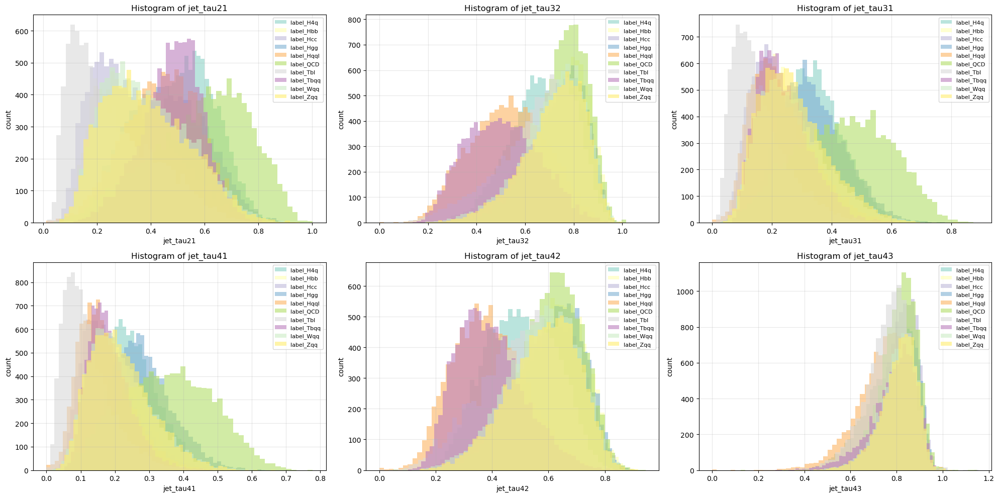

Plot saved in /home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots/


In [ ]:
jet_features = ['jet_tau21', 'jet_tau32', 'jet_tau31', 'jet_tau41', 'jet_tau42', 'jet_tau43']

# Llamar la función con parámetros personalizados
hist_feature_comparison_subplots_advanced(jet_features, path_file, bins=50, alpha=0.6, rows = 2, cols = 3)

jet_pt - label_H4q: 10000 eventos
jet_pt - label_Hbb: 10000 eventos
jet_pt - label_Hcc: 10000 eventos
jet_pt - label_Hgg: 10000 eventos
jet_pt - label_Hqql: 10000 eventos
jet_pt - label_QCD: 10000 eventos
jet_pt - label_Tbl: 10000 eventos
jet_pt - label_Tbqq: 10000 eventos
jet_pt - label_Wqq: 10000 eventos
jet_pt - label_Zqq: 10000 eventos
jet_eta - label_H4q: 10000 eventos
jet_eta - label_Hbb: 10000 eventos
jet_eta - label_Hcc: 10000 eventos
jet_eta - label_Hgg: 10000 eventos
jet_eta - label_Hqql: 10000 eventos
jet_eta - label_QCD: 10000 eventos
jet_eta - label_Tbl: 10000 eventos
jet_eta - label_Tbqq: 10000 eventos
jet_eta - label_Wqq: 10000 eventos
jet_eta - label_Zqq: 10000 eventos
jet_phi - label_H4q: 10000 eventos
jet_phi - label_Hbb: 10000 eventos
jet_phi - label_Hcc: 10000 eventos
jet_phi - label_Hgg: 10000 eventos
jet_phi - label_Hqql: 10000 eventos
jet_phi - label_QCD: 10000 eventos
jet_phi - label_Tbl: 10000 eventos
jet_phi - label_Tbqq: 10000 eventos
jet_phi - label_Wqq: 100

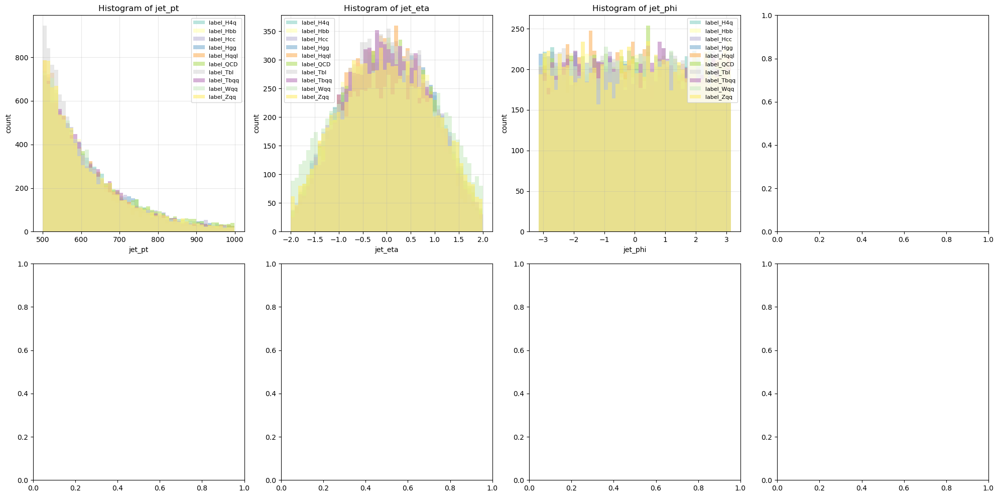

Plot saved in /home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots/


In [ ]:
jet_features = ['jet_pt', 'jet_eta', 'jet_phi']

# Llamar la función con parámetros personalizados
hist_feature_comparison_subplots_advanced(jet_features, path_file, bins=50, alpha=0.6)

In [ ]:
def create_jet_features_pairplot_advanced(path_file, features_subset=None):
    """
    Crea un pairplot avanzado con más opciones de personalización
    """
    import seaborn as sns
    import pandas as pd
    
    # Lista completa de features de jet
    all_jet_features = ['jet_energy', 'jet_sdmass', 'jet_pt', 'jet_nparticles', 
                        'jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4', 
                        'jet_tau21', 'jet_tau32']
    
    # Usar subset si se especifica
    if features_subset is None:
        jet_features = all_jet_features
    else:
        jet_features = [f for f in features_subset if f in all_jet_features]
    
    print(f"Creando pairplot con {len(jet_features)} features: {jet_features}")
    
    # Crear DataFrame
    data_dict = {}
    for feature in jet_features:
        data_dict[feature] = table[feature]
    
    data_dict['label'] = table["labels"]
    df = pd.DataFrame(data_dict)
    
    # Configurar el estilo
    sns.set_style("whitegrid")
    
    # Crear pairplot con diferentes opciones
    pair_plot = sns.pairplot(
        df, 
        hue='label',
        diag_kind='kde',  # 'hist' para histogramas, 'kde' para densidad
        plot_kws={
            'alpha': 0.6, 
            's': 15,
            'edgecolors': 'none'
        },
        diag_kws={
            'alpha': 0.7,
            'linewidth': 1.5
        },
        corner=False,  # True para mostrar solo la mitad inferior
        height=2.5,    # Tamaño de cada subplot
        aspect=1       # Relación aspecto
    )
    
    # Personalizar el título
    pair_plot.figure.suptitle(f'Pairplot: Observer Features of Jet', 
                          y=1.02, fontsize=12)
    pair_plot.figure.subplots_adjust(top=0.95)
    
    # Guardar con alta resolución
    plt.savefig(f"{path_file}/jet_features_pairplot_advanced.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


Creando pairplot con 10 features: ['jet_energy', 'jet_sdmass', 'jet_pt', 'jet_nparticles', 'jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4', 'jet_tau21', 'jet_tau32']


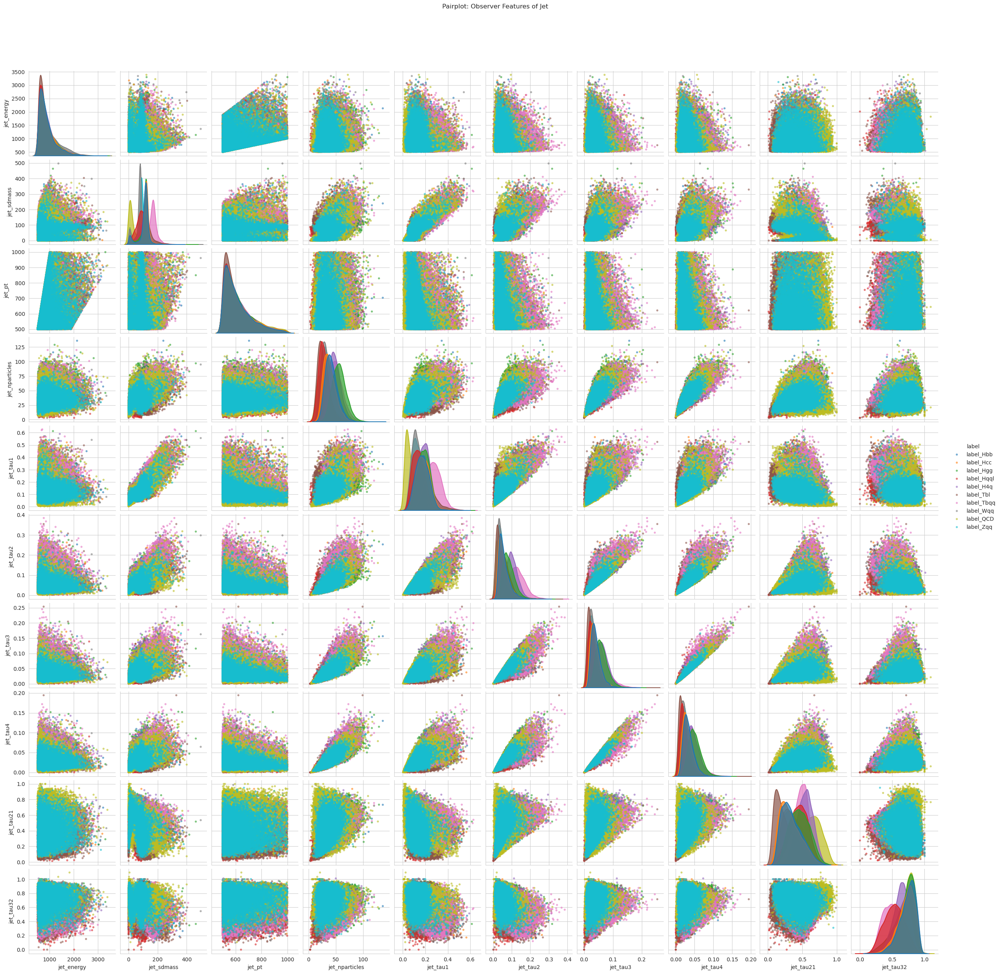

Creando pairplot con 4 features: ['jet_pt', 'jet_energy', 'jet_sdmass', 'jet_nparticles']


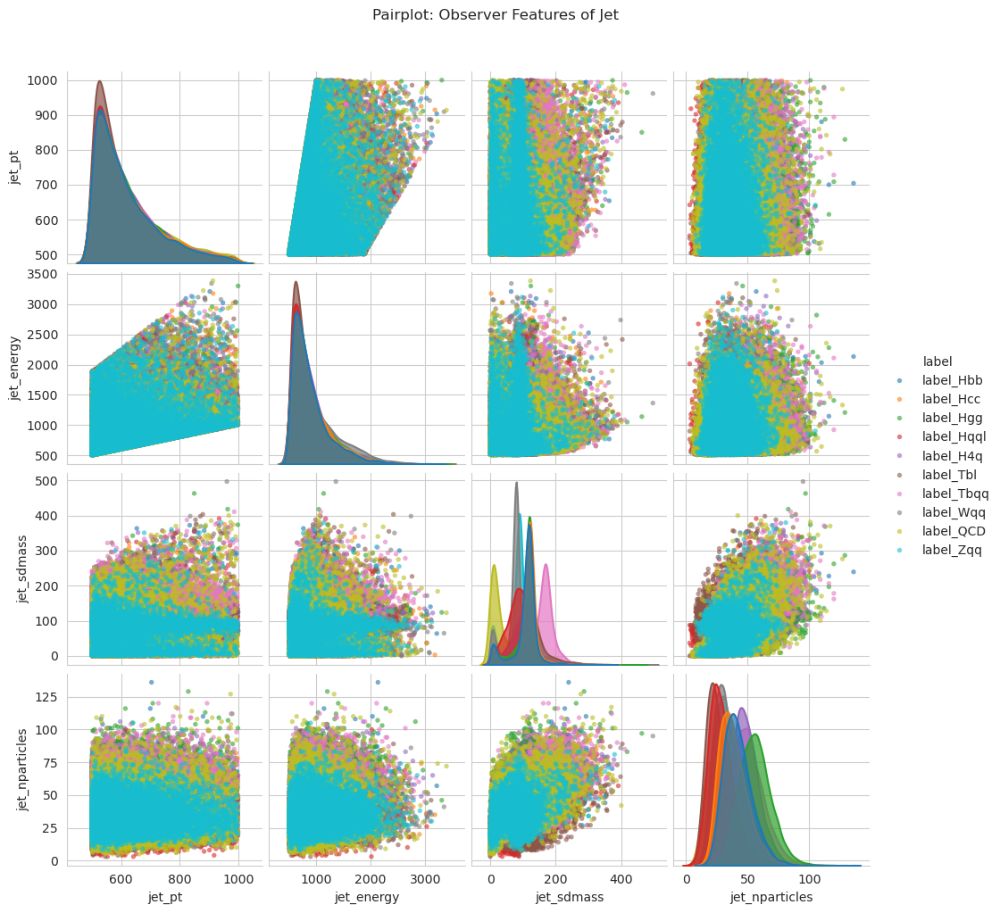

In [ ]:

# Ejemplos de uso:
# Pairplot completo
create_jet_features_pairplot_advanced(path_file)

# Pairplot con subset de features
create_jet_features_pairplot_advanced(path_file, 
                                     features_subset=['jet_pt', 'jet_energy', 'jet_sdmass', 'jet_nparticles'])

Creando pairplot con 4 features: ['jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4']


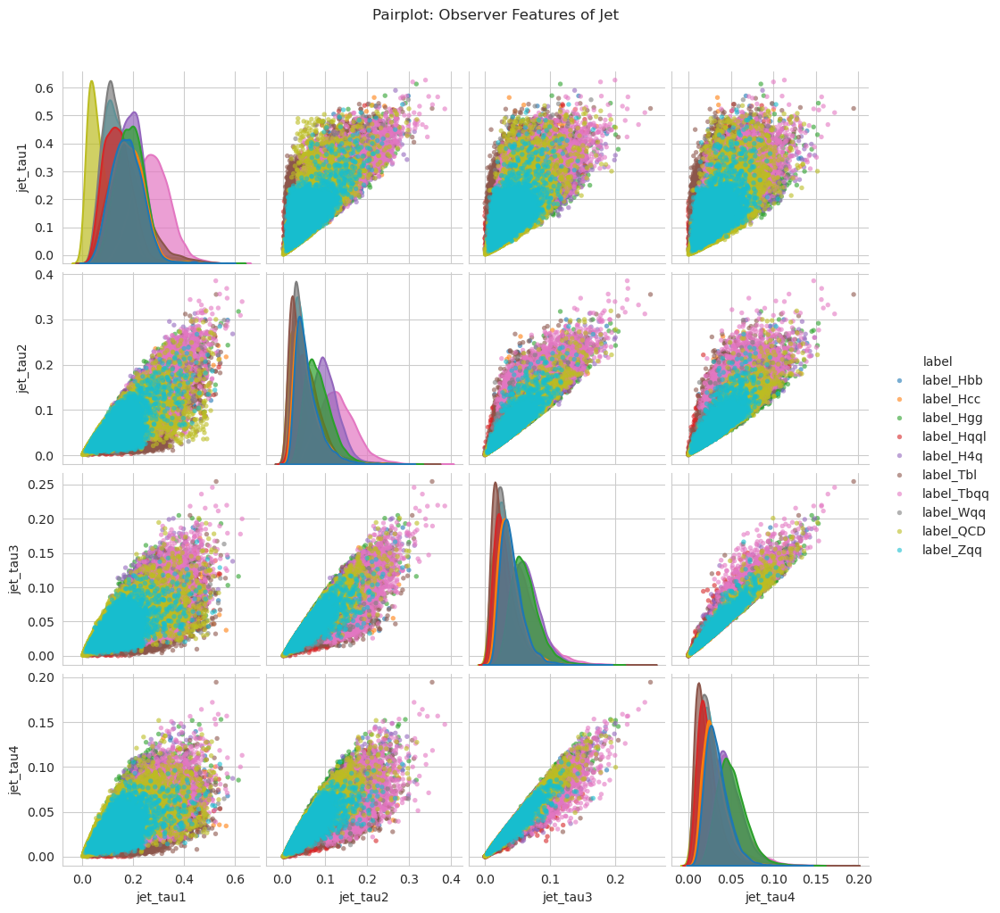

In [ ]:
# Pairplot con subset de features
create_jet_features_pairplot_advanced(path_file, 
                                     features_subset=['jet_tau1','jet_tau2','jet_tau3','jet_tau4'])

Creando pairplot con 2 features: ['jet_tau21', 'jet_tau32']


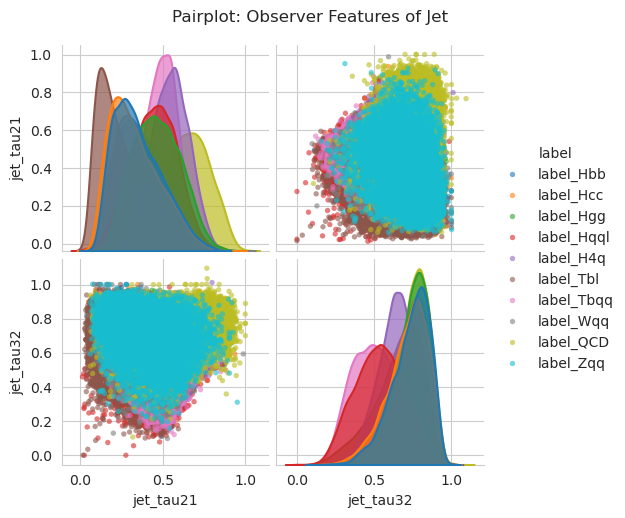

In [ ]:
create_jet_features_pairplot_advanced(path_file, 
                                     features_subset=['jet_tau21', 'jet_tau32'])

In [ ]:
# Construct a Lorentz 4-vector from the (px, py, pz, energy) arrays
p4 = vector.zip({'px': table['part_px'], 'py': table['part_py'], 'pz': table['part_pz'], 'energy': table['part_energy']})

In [ ]:
# Función modificada para filtrar por labels específicos
def create_jet_features_pairplot_advanced(path_file, features_subset=None, labels_filter=None):
    """
    Crea un pairplot avanzado con más opciones de personalización
    
    Args:
        path_file: ruta al archivo (para guardar la imagen)
        features_subset: lista de features específicos a incluir
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
    """
    import seaborn as sns
    import pandas as pd
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Lista completa de features de jet
    all_jet_features = ['jet_energy', 'jet_sdmass', 'jet_pt', 'jet_nparticles', 
                        'jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4', 
                        'jet_tau21', 'jet_tau32']
    
    # Usar subset si se especifica
    if features_subset is None:
        jet_features = all_jet_features
    else:
        jet_features = [f for f in features_subset if f in all_jet_features]
    
    print(f"Creando pairplot con {len(jet_features)} features: {jet_features}")
    
    # Crear DataFrame
    data_dict = {}
    for feature in jet_features:
        data_dict[feature] = table[feature]
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            # Verificar si el label existe en el table usando hasattr
            if hasattr(table, label):
                # Convertir a numpy array para evitar problemas de compatibilidad
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Aplicar filtro a todos los datos
        filtered_data_dict = {}
        for feature in jet_features:
            filtered_data_dict[feature] = np.array(table[feature])[label_mask]
        
        # Crear labels simplificados para el pairplot
        filtered_labels = []
        for i in range(len(table)):
            if label_mask[i]:
                for label in labels_filter:
                    if hasattr(table, label) and np.array(table[label])[i] == 1:
                        filtered_labels.append(label.replace('label_', ''))  # Quitar prefijo
                        break
        
        filtered_data_dict['label'] = filtered_labels
        df = pd.DataFrame(filtered_data_dict)
        
        print(f"Datos filtrados: {len(df)} muestras")
        print(f"Distribución de labels: {df['label'].value_counts().to_dict()}")
        
    else:
        # Sin filtro - usar todos los datos
        data_dict['label'] = table["labels"]
        df = pd.DataFrame(data_dict)
        print(f"Datos completos: {len(df)} muestras")
    
    # Configurar el estilo
    sns.set_style("whitegrid")
    
    # Crear pairplot con diferentes opciones
    pair_plot = sns.pairplot(
        df, 
        hue='label',
        diag_kind='kde',  # 'hist' para histogramas, 'kde' para densidad
        plot_kws={
            'alpha': 0.6, 
            's': 15,
            'edgecolors': 'none'
        },
        diag_kws={
            'alpha': 0.7,
            'linewidth': 1.5
        },
        corner=False,  # True para mostrar solo la mitad inferior
        height=2.5,    # Tamaño de cada subplot
        aspect=1       # Relación aspecto
    )
    
    # Personalizar el título
    title_suffix = f" - Labels: {', '.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    pair_plot.figure.suptitle(f'Pairplot: Observer Features of Jet{title_suffix}', 
                          y=1.02, fontsize=12)
    pair_plot.figure.subplots_adjust(top=0.95)
    
    # Guardar con alta resolución
    filename_suffix = f"_{'_'.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    plt.savefig(f"{path_file}/jet_features_pairplot_advanced{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


Creando pairplot con 2 features: ['jet_tau1', 'jet_tau2']
Filtrando por labels: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 muestras
Distribución de labels: {'Wqq': 10000, 'QCD': 10000}


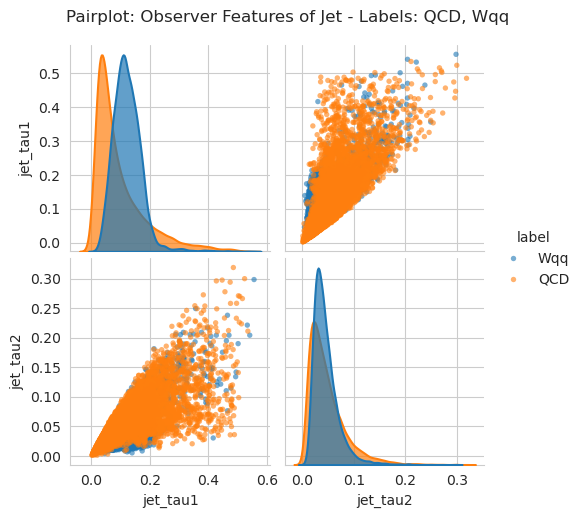

In [ ]:
# Ejemplos de uso de la función modificada

# 1. Filtrar solo QCD y Wqq
create_jet_features_pairplot_advanced(path_file, 
                                     features_subset=['jet_tau1','jet_tau2'],
                                     labels_filter=['label_QCD', 'label_Wqq'])

# 2. Filtrar solo señales (sin QCD)
# create_jet_features_pairplot_advanced(path_file, 
#                                      features_subset=['jet_tau1','jet_tau2','jet_tau3','jet_tau4'],
#                                      labels_filter=['label_Wqq', 'label_Zqq', 'label_Hbb'])

# 3. Sin filtro (todos los labels)
# create_jet_features_pairplot_advanced(path_file, 
#                                      features_subset=['jet_tau1','jet_tau2','jet_tau3','jet_tau4'])


In [ ]:
# Función modificada para filtrar por labels específicos en histogramas
def hist_feature_comparison_subplots_advanced(features_list, path_file, bins=100, alpha=0.5, labels_filter=None):
    """
    Genera histogramas con opciones personalizables y filtro de labels
    
    Args:
        features_list: lista de features a graficar
        path_file: ruta para guardar la imagen
        bins: número de bins para los histogramas
        alpha: transparencia de los histogramas
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            # Verificar si el label existe en el table usando hasattr
            if hasattr(table, label):
                # Convertir a numpy array para evitar problemas de compatibilidad
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Aplicar filtro a los labels
        filtered_labels = []
        for i in range(len(table)):
            if label_mask[i]:
                for label in labels_filter:
                    if hasattr(table, label) and np.array(table[label])[i] == 1:
                        filtered_labels.append(label.replace('label_', ''))  # Quitar prefijo
                        break
        
        labels = np.array(filtered_labels)
        unique_labels = np.unique(labels)
        
        print(f"Datos filtrados: {len(labels)} muestras")
        print(f"Labels únicos: {unique_labels}")
        
    else:
        # Sin filtro - usar todos los datos
        labels = table["labels"]
        unique_labels = np.unique(labels)
        print(f"Datos completos: {len(labels)} muestras")
    
    # Crear figura con subplots 2x4
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    # Colores para las etiquetas
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for i, feature in enumerate(features_list):
        if i >= 8:
            break
            
        ax = axes[i]
        
        # Aplicar filtro a los datos de features si se especifica
        if labels_filter is not None:
            jet_feat = np.array(table[feature])[label_mask]
        else:
            jet_feat = table[feature]
        
        for j, label in enumerate(unique_labels):
            mask = labels == label
            count = len(jet_feat[mask])
            print(f"{feature} - {label}: {count} eventos")
            ax.hist(jet_feat[mask], bins=bins, alpha=alpha, 
                   label=str(label), color=colors[j])
        
        ax.set_xlabel(feature)
        ax.set_ylabel('count')
        
        # Personalizar el título
        title_suffix = f"\n Labels: {', '.join(labels_filter).replace('label_', '')}" if labels_filter else ""
        ax.set_title(f'Histogram of {feature}{title_suffix}')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Rotar etiquetas del eje x si son muy largas
        if len(feature) > 10:
            ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    
    # Guardar con sufijo que indica qué labels se usaron
    filename_suffix = f"_{'_'.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    plt.savefig(f"{path_file}/all_features_hist_subplots_advanced{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


Filtrando por labels: ['label_QCD', 'label_H4q', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_Hqql']
Datos filtrados: 60000 muestras
Labels únicos: ['H4q' 'Hbb' 'Hcc' 'Hgg' 'Hqql' 'QCD']
jet_tau1 - H4q: 10000 eventos
jet_tau1 - Hbb: 10000 eventos
jet_tau1 - Hcc: 10000 eventos
jet_tau1 - Hgg: 10000 eventos
jet_tau1 - Hqql: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - H4q: 10000 eventos
jet_tau2 - Hbb: 10000 eventos
jet_tau2 - Hcc: 10000 eventos
jet_tau2 - Hgg: 10000 eventos
jet_tau2 - Hqql: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - H4q: 10000 eventos
jet_tau3 - Hbb: 10000 eventos
jet_tau3 - Hcc: 10000 eventos
jet_tau3 - Hgg: 10000 eventos
jet_tau3 - Hqql: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - H4q: 10000 eventos
jet_tau4 - Hbb: 10000 eventos
jet_tau4 - Hcc: 10000 eventos
jet_tau4 - Hgg: 10000 eventos
jet_tau4 - Hqql: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - H4q: 10000 eventos
jet_tau21 - Hbb: 10000 eventos
jet_tau21 - Hcc: 10000 eve

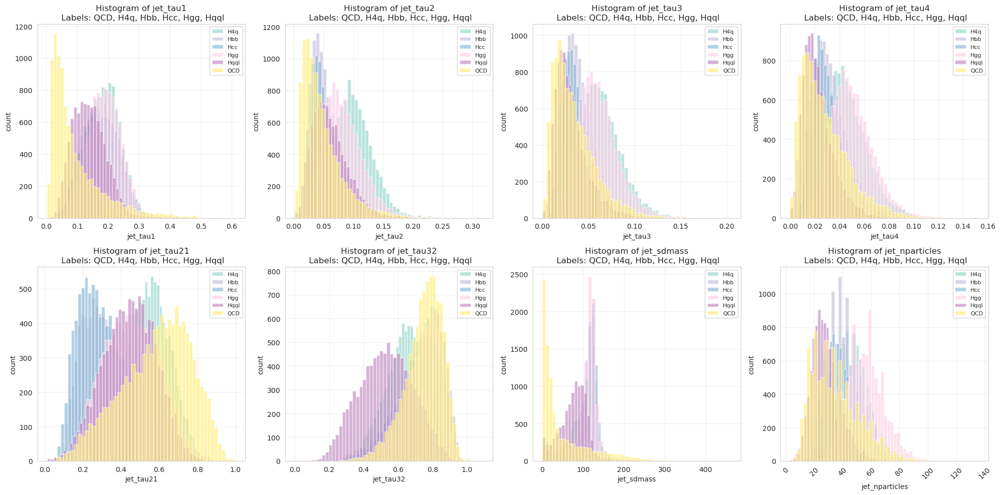

In [ ]:
# Ejemplos de uso de la función de histogramas modificada

# Definir las features que quieres graficar
jet_features = ['jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4',
                'jet_tau21', 'jet_tau32','jet_sdmass', 'jet_nparticles', ]


# 1. Filtrar solo QCD y Wqq
hist_feature_comparison_subplots_advanced(jet_features, path_file, 
                                         bins=50, alpha=0.6,
                                         labels_filter=['label_QCD', 'label_H4q', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_Hqql'])

Filtrando por labels: ['label_QCD', 'label_Tbl', 'label_Tbqq']
Datos filtrados: 30000 muestras
Labels únicos: ['QCD' 'Tbl' 'Tbqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Tbl: 10000 eventos
jet_tau1 - Tbqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Tbl: 10000 eventos
jet_tau2 - Tbqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Tbl: 10000 eventos
jet_tau3 - Tbqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Tbl: 10000 eventos
jet_tau4 - Tbqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Tbl: 10000 eventos
jet_tau21 - Tbqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Tbl: 10000 eventos
jet_tau32 - Tbqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Tbl: 10000 eventos
jet_sdmass - Tbqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Tbl: 10000 eventos
jet_nparticles - Tbqq: 10000 eventos


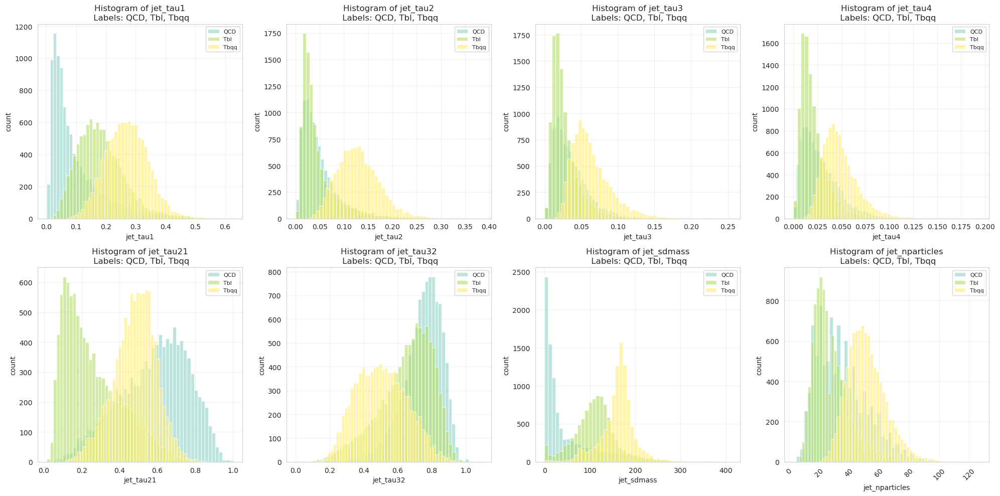

In [ ]:
# Ejemplos de uso de la función de histogramas modificada

# Definir las features que quieres graficar
jet_features = ['jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4',
                'jet_tau21', 'jet_tau32','jet_sdmass', 'jet_nparticles', ]


# 1. Filtrar solo QCD y Wqq
hist_feature_comparison_subplots_advanced(jet_features, path_file, 
                                         bins=50, alpha=0.6,
                                         labels_filter=['label_QCD',  'label_Tbl', 'label_Tbqq',])

Filtrando por labels: ['label_QCD', 'label_Wqq', 'label_Zqq']
Datos filtrados: 30000 muestras
Labels únicos: ['QCD' 'Wqq' 'Zqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Wqq: 10000 eventos
jet_tau1 - Zqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Wqq: 10000 eventos
jet_tau2 - Zqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Wqq: 10000 eventos
jet_tau3 - Zqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Wqq: 10000 eventos
jet_tau4 - Zqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Wqq: 10000 eventos
jet_tau21 - Zqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Wqq: 10000 eventos
jet_tau32 - Zqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Wqq: 10000 eventos
jet_sdmass - Zqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Wqq: 10000 eventos
jet_nparticles - Zqq: 10000 eventos


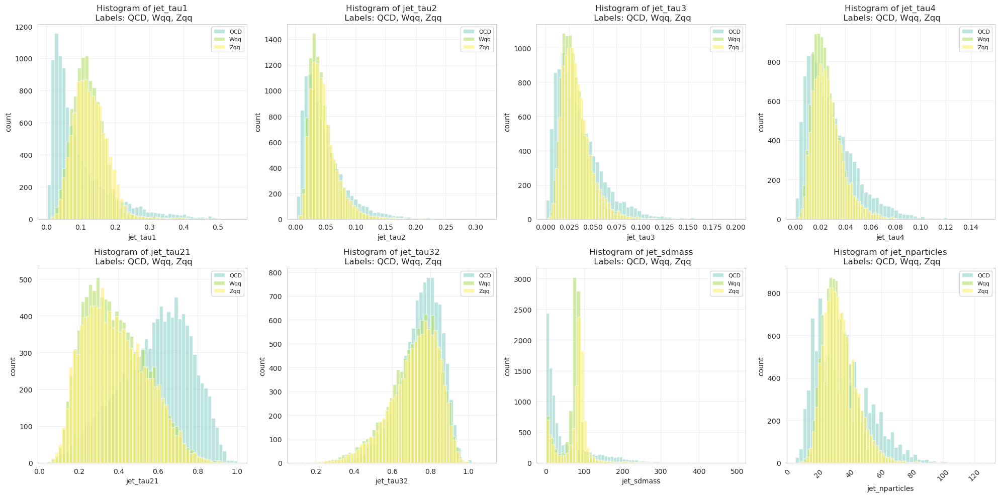

In [ ]:
# Ejemplos de uso de la función de histogramas modificada

# Definir las features que quieres graficar
jet_features = ['jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4',
                'jet_tau21', 'jet_tau32','jet_sdmass', 'jet_nparticles', ]


# 1. Filtrar solo QCD y Wqq
hist_feature_comparison_subplots_advanced(jet_features, path_file, 
                                         bins=50, alpha=0.6,
                                         labels_filter=['label_QCD', 'label_Wqq','label_Zqq'])

In [ ]:
# Función modificada para generar PDFs en lugar de histogramas
def pdf_feature_comparison_subplots_advanced(features_list, path_file, labels_filter=None):
    """
    Genera PDFs (Probability Density Functions) con opciones personalizables y filtro de labels
    
    Args:
        features_list: lista de features a graficar
        path_file: ruta para guardar la imagen
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    from scipy import stats
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            # Verificar si el label existe en el table usando hasattr
            if hasattr(table, label):
                # Convertir a numpy array para evitar problemas de compatibilidad
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Aplicar filtro a los labels
        filtered_labels = []
        for i in range(len(table)):
            if label_mask[i]:
                for label in labels_filter:
                    if hasattr(table, label) and np.array(table[label])[i] == 1:
                        filtered_labels.append(label.replace('label_', ''))  # Quitar prefijo
                        break
        
        labels = np.array(filtered_labels)
        unique_labels = np.unique(labels)
        
        print(f"Datos filtrados: {len(labels)} muestras")
        print(f"Labels únicos: {unique_labels}")
        
    else:
        # Sin filtro - usar todos los datos
        labels = table["labels"]
        unique_labels = np.unique(labels)
        print(f"Datos completos: {len(labels)} muestras")
    
    # Crear figura con subplots 2x4
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    # Colores para las etiquetas
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for i, feature in enumerate(features_list):
        if i >= 8:
            break
            
        ax = axes[i]
        
        # Aplicar filtro a los datos de features si se especifica
        if labels_filter is not None:
            jet_feat = np.array(table[feature])[label_mask]
        else:
            jet_feat = table[feature]
        
        for j, label in enumerate(unique_labels):
            mask = labels == label
            data = jet_feat[mask]
            
            if len(data) > 0:  # Solo graficar si hay datos
                # Generar PDF usando seaborn
                sns.kdeplot(data=data, ax=ax, label=str(label), 
                           color=colors[j], linewidth=2.5, alpha=0.8)
                
                # También agregar un histograma suavizado como fondo
                ax.hist(data, bins=50, alpha=0.1, color=colors[j], density=True)
                
                count = len(data)
                print(f"{feature} - {label}: {count} eventos")
        
        ax.set_xlabel(feature, fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        
        # Personalizar el título
        title_suffix = f" - Labels: {', '.join(labels_filter).replace('label_', '')}" if labels_filter else ""
        ax.set_title(f'PDF of {feature}{title_suffix}', fontsize=11, fontweight='bold')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Rotar etiquetas del eje x si son muy largas
        if len(feature) > 10:
            ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    
    # Guardar con sufijo que indica qué labels se usaron
    filename_suffix = f"_{'_'.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    plt.savefig(f"{path_file}/all_features_pdf_subplots_advanced{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


In [ ]:
# Función actualizada para generar PDFs en todas las comparaciones QCD vs otros labels
def generate_all_qcd_comparisons_pdf(features_list, path_file):
    """
    Genera PDFs y pairplots para todas las combinaciones de QCD con otros labels
    
    Args:
        features_list: lista de features a graficar
        path_file: ruta para guardar las imágenes
    """
    import os
    
    # Obtener todos los labels disponibles (excluyendo QCD)
    all_labels = []
    for key in dir(table):
        if key.startswith('label_') and key != 'label_QCD':
            all_labels.append(key)
    
    print(f"Labels encontrados (excluyendo QCD): {all_labels}")
    
    # Crear directorio para guardar los resultados
    comparison_dir = f"{path_file}/qcd_comparisons_pdf"
    os.makedirs(comparison_dir, exist_ok=True)
    
    # Iterar sobre cada combinación QCD + otro label
    for other_label in all_labels:
        print(f"\n{'='*50}")
        print(f"Generando comparación PDF: QCD vs {other_label}")
        print(f"{'='*50}")
        
        # Crear subdirectorio para esta comparación
        label_name = other_label.replace('label_', '')
        subdir = f"{comparison_dir}/QCD_vs_{label_name}"
        os.makedirs(subdir, exist_ok=True)
        
        # Generar PDFs
        print(f"Generando PDFs para QCD vs {label_name}...")
        pdf_feature_comparison_subplots_advanced(
            features_list, subdir,
            labels_filter=['label_QCD', other_label]
        )
        
        
        print(f"✅ Completado: QCD vs {label_name}")
    
    print(f"\n{'='*50}")
    print(f"🎉 Todas las comparaciones PDF completadas!")
    print(f"📁 Resultados guardados en: {comparison_dir}")
    print(f"{'='*50}")


Labels encontrados (excluyendo QCD): ['label_H4q', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_Hqql', 'label_Tbl', 'label_Tbqq', 'label_Wqq', 'label_Zqq']

Generando comparación PDF: QCD vs label_H4q
Generando PDFs para QCD vs H4q...
Filtrando por labels: ['label_QCD', 'label_H4q']
Datos filtrados: 20000 muestras
Labels únicos: ['H4q' 'QCD']
jet_tau1 - H4q: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - H4q: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - H4q: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - H4q: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - H4q: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - H4q: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - H4q: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - H4q: 10000 eventos
jet_nparticles - QCD: 10000 eventos


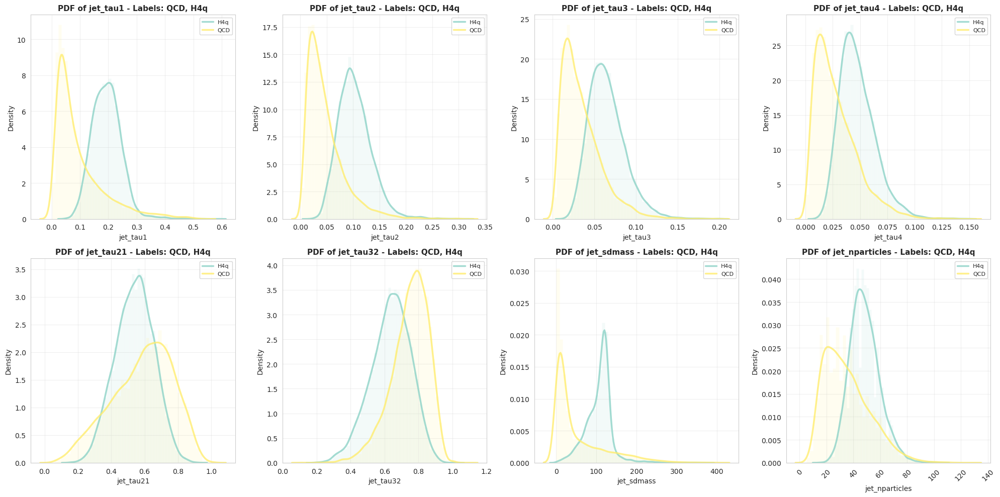

✅ Completado: QCD vs H4q

Generando comparación PDF: QCD vs label_Hbb
Generando PDFs para QCD vs Hbb...
Filtrando por labels: ['label_QCD', 'label_Hbb']
Datos filtrados: 20000 muestras
Labels únicos: ['Hbb' 'QCD']
jet_tau1 - Hbb: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hbb: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hbb: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hbb: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hbb: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hbb: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hbb: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hbb: 10000 eventos
jet_nparticles - QCD: 10000 eventos


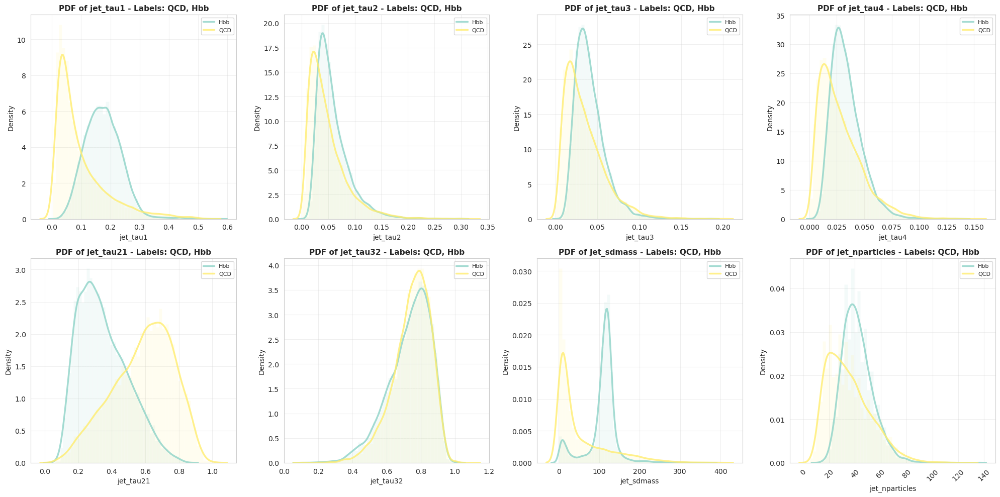

✅ Completado: QCD vs Hbb

Generando comparación PDF: QCD vs label_Hcc
Generando PDFs para QCD vs Hcc...
Filtrando por labels: ['label_QCD', 'label_Hcc']
Datos filtrados: 20000 muestras
Labels únicos: ['Hcc' 'QCD']
jet_tau1 - Hcc: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hcc: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hcc: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hcc: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hcc: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hcc: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hcc: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hcc: 10000 eventos
jet_nparticles - QCD: 10000 eventos


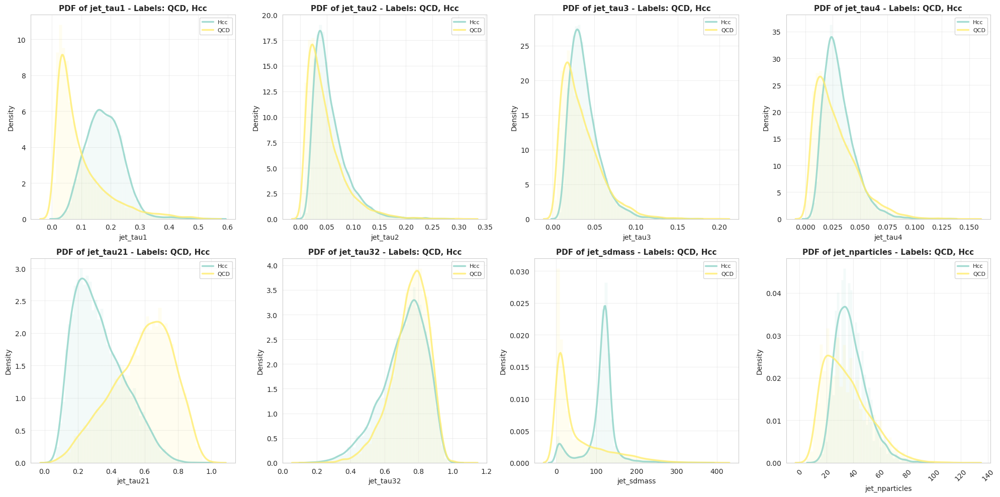

✅ Completado: QCD vs Hcc

Generando comparación PDF: QCD vs label_Hgg
Generando PDFs para QCD vs Hgg...
Filtrando por labels: ['label_QCD', 'label_Hgg']
Datos filtrados: 20000 muestras
Labels únicos: ['Hgg' 'QCD']
jet_tau1 - Hgg: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hgg: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hgg: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hgg: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hgg: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hgg: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hgg: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hgg: 10000 eventos
jet_nparticles - QCD: 10000 eventos


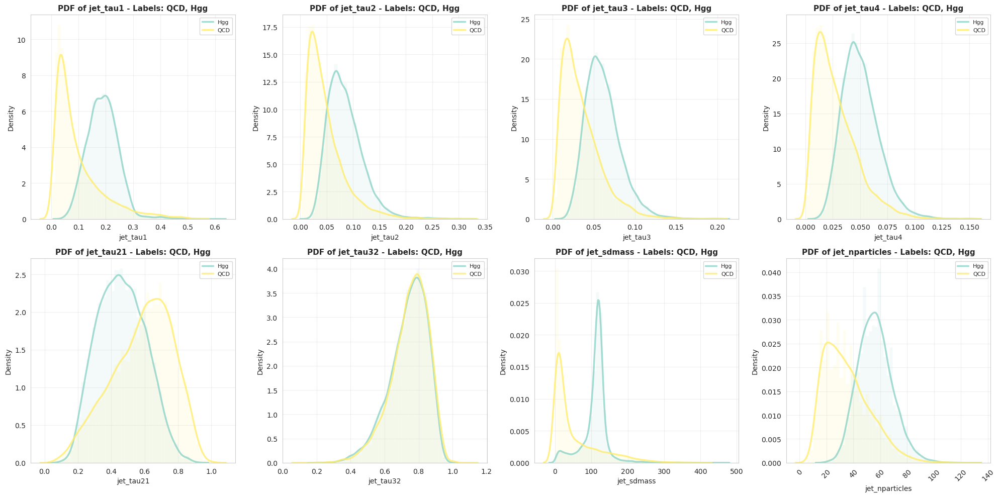

✅ Completado: QCD vs Hgg

Generando comparación PDF: QCD vs label_Hqql
Generando PDFs para QCD vs Hqql...
Filtrando por labels: ['label_QCD', 'label_Hqql']
Datos filtrados: 20000 muestras
Labels únicos: ['Hqql' 'QCD']
jet_tau1 - Hqql: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hqql: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hqql: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hqql: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hqql: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hqql: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hqql: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hqql: 10000 eventos
jet_nparticles - QCD: 10000 eventos


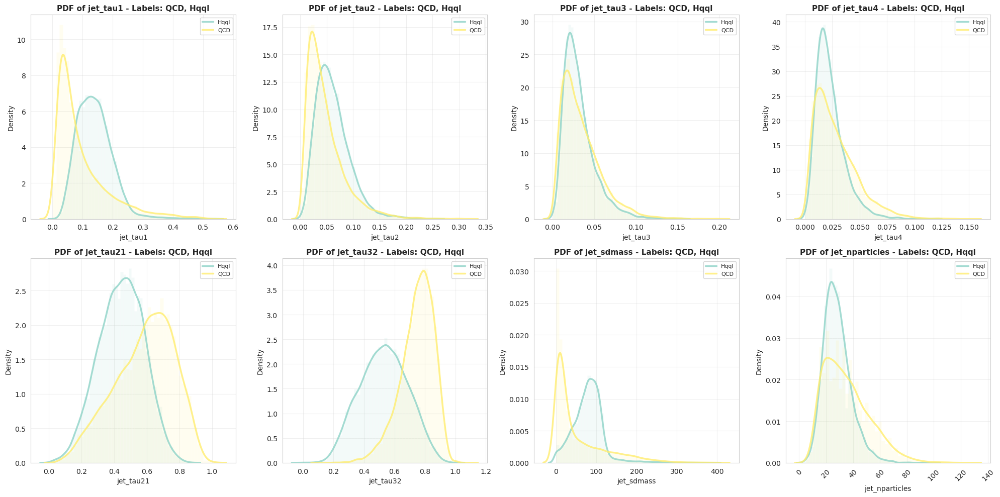

✅ Completado: QCD vs Hqql

Generando comparación PDF: QCD vs label_Tbl
Generando PDFs para QCD vs Tbl...
Filtrando por labels: ['label_QCD', 'label_Tbl']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Tbl']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Tbl: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Tbl: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Tbl: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Tbl: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Tbl: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Tbl: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Tbl: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Tbl: 10000 eventos


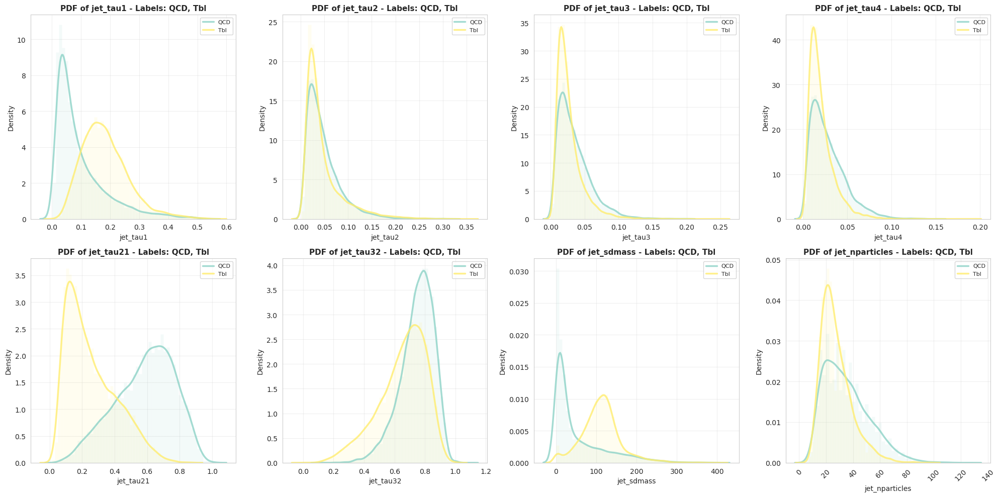

✅ Completado: QCD vs Tbl

Generando comparación PDF: QCD vs label_Tbqq
Generando PDFs para QCD vs Tbqq...
Filtrando por labels: ['label_QCD', 'label_Tbqq']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Tbqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Tbqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Tbqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Tbqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Tbqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Tbqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Tbqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Tbqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Tbqq: 10000 eventos


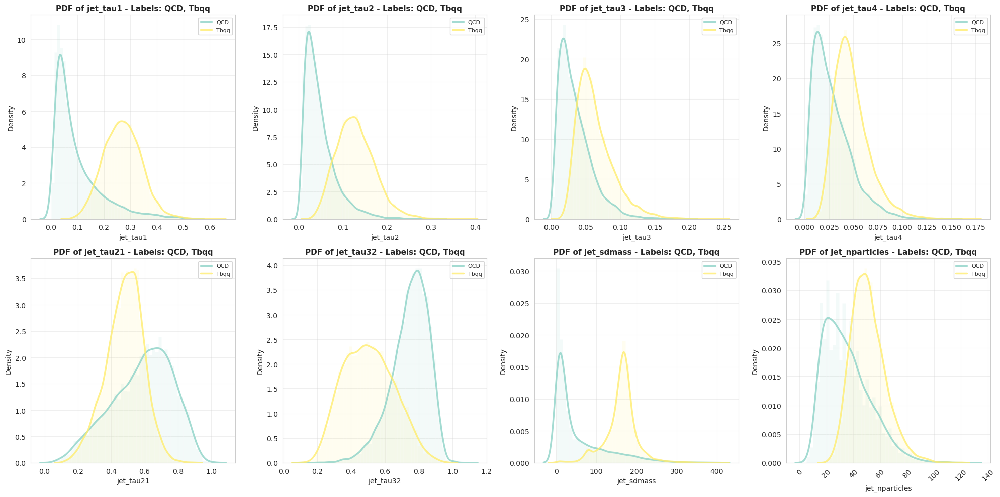

✅ Completado: QCD vs Tbqq

Generando comparación PDF: QCD vs label_Wqq
Generando PDFs para QCD vs Wqq...
Filtrando por labels: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Wqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Wqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Wqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Wqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Wqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Wqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Wqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Wqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Wqq: 10000 eventos


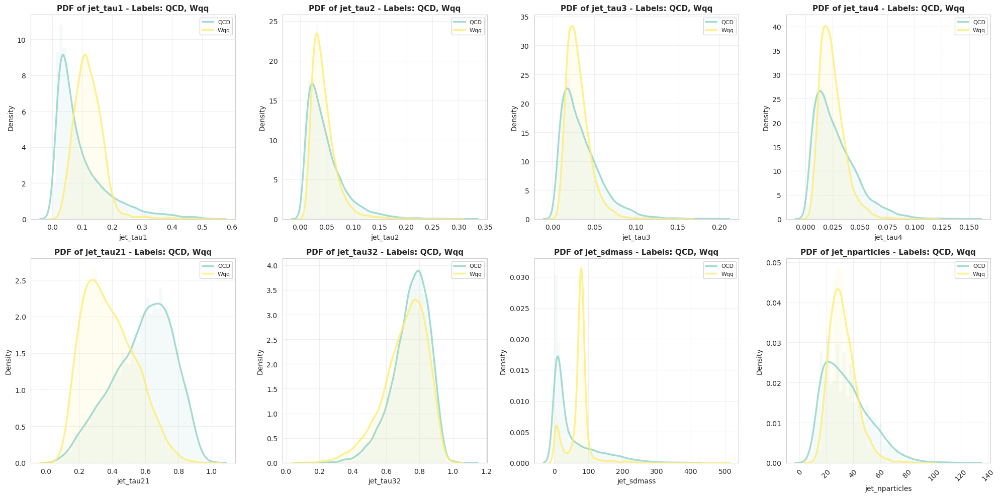

✅ Completado: QCD vs Wqq

Generando comparación PDF: QCD vs label_Zqq
Generando PDFs para QCD vs Zqq...
Filtrando por labels: ['label_QCD', 'label_Zqq']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Zqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Zqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Zqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Zqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Zqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Zqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Zqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Zqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Zqq: 10000 eventos


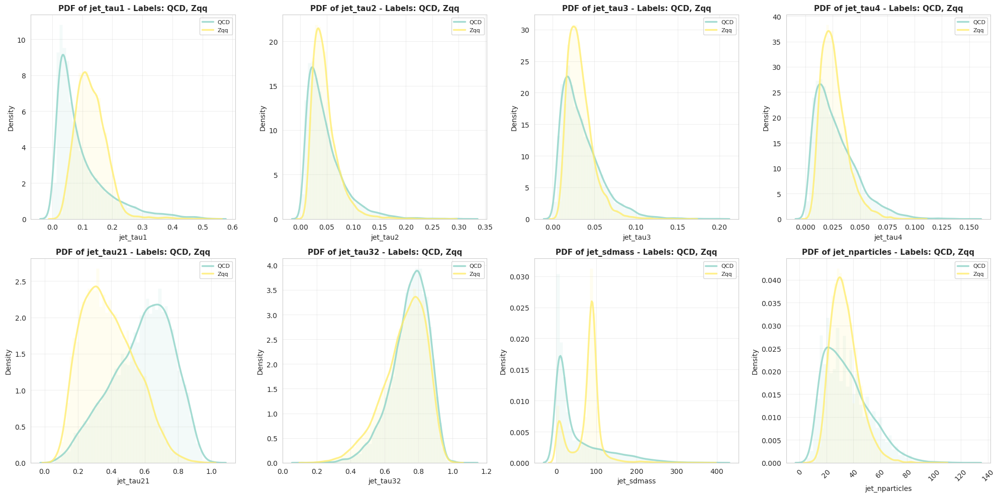

✅ Completado: QCD vs Zqq

🎉 Todas las comparaciones PDF completadas!
📁 Resultados guardados en: /home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots//qcd_comparisons_pdf


In [ ]:
# Ejemplos de uso: Generar PDFs para todas las comparaciones QCD vs otros labels

# Definir las features que quieres graficar
jet_features = ['jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4',
'jet_tau21', 'jet_tau32', 'jet_sdmass', 'jet_nparticles', 
                ]

# Generar todas las comparaciones PDF automáticamente
generate_all_qcd_comparisons_pdf(jet_features, path_file)

# También puedes generar PDFs individuales:
# pdf_feature_comparison_subplots_advanced(jet_features, path_file, 
#                                         labels_filter=['label_QCD', 'label_Wqq'])


In [ ]:
# Verificar qué campos están disponibles en la tabla
print("Campos disponibles en la tabla:")
print("="*50)

# Obtener todos los campos que empiezan con 'part_'
part_fields = [field for field in dir(table) if field.startswith('part_')]
print("Campos de partículas:")
for field in sorted(part_fields):
    print(f"  • {field}")

print("\nCampos de jet:")
jet_fields = [field for field in dir(table) if field.startswith('jet_')]
for field in sorted(jet_fields):
    print(f"  • {field}")

print("\nCampos de labels:")
label_fields = [field for field in dir(table) if field.startswith('label_')]
for field in sorted(label_fields):
    print(f"  • {field}")

# Verificar si podemos calcular pT a partir de px, py
if 'part_px' in part_fields and 'part_py' in part_fields:
    print("\n✅ Podemos calcular pT usando: pT = sqrt(px² + py²)")
else:
    print("\n❌ No podemos calcular pT - faltan campos px, py")


Campos disponibles en la tabla:
Campos de partículas:
  • part_charge
  • part_d0err
  • part_d0val
  • part_deta
  • part_dphi
  • part_dzerr
  • part_dzval
  • part_energy
  • part_isChargedHadron
  • part_isElectron
  • part_isMuon
  • part_isNeutralHadron
  • part_isPhoton
  • part_px
  • part_py
  • part_pz

Campos de jet:
  • jet_energy
  • jet_eta
  • jet_nparticles
  • jet_phi
  • jet_pt
  • jet_sdmass
  • jet_tau1
  • jet_tau2
  • jet_tau21
  • jet_tau3
  • jet_tau31
  • jet_tau32
  • jet_tau4
  • jet_tau41
  • jet_tau42
  • jet_tau43

Campos de labels:
  • label_H4q
  • label_Hbb
  • label_Hcc
  • label_Hgg
  • label_Hqql
  • label_QCD
  • label_Tbl
  • label_Tbqq
  • label_Wqq
  • label_Zqq

✅ Podemos calcular pT usando: pT = sqrt(px² + py²)


In [ ]:
# FUNCIÓN CORREGIDA PARA HEATMAPS - Calcula pT desde px, py
def create_jet_energy_heatmaps_fixed(path_file, labels_filter=None, bins=50):
    """
    Crea histogramas 2D de energía (imágenes de jets promedio) para cada clase
    CORREGIDA: Calcula pT a partir de px y py
    
    Args:
        path_file: ruta para guardar las imágenes
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
        bins: número de bins para el histograma 2D
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    from matplotlib.colors import LogNorm
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            if hasattr(table, label):
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Obtener índices de jets filtrados
        filtered_jet_indices = np.where(label_mask)[0]
        
        print(f"Datos filtrados: {len(filtered_jet_indices)} jets")
        
    else:
        # Sin filtro - usar todos los datos
        filtered_jet_indices = np.arange(len(table))
        print(f"Datos completos: {len(filtered_jet_indices)} jets")
    
    # Crear figura con subplots
    n_labels = len(labels_filter) if labels_filter else len(np.unique(table["labels"]))
    n_cols = min(3, n_labels)
    n_rows = (n_labels + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    if n_labels == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    # Rango para los ejes (basado en los datos)
    deta_range = (-0.8, 0.8)
    dphi_range = (-0.8, 0.8)
    
    # Procesar cada label
    for i, label in enumerate(labels_filter if labels_filter else ['all']):
        ax = axes[i]
        
        # Filtrar datos para esta clase específica
        all_deta = []
        all_dphi = []
        all_pt = []
        
        for jet_idx in filtered_jet_indices:
            # Verificar si este jet pertenece a la clase actual
            if labels_filter:
                jet_belongs_to_class = False
                for target_label in labels_filter:
                    if hasattr(table, target_label) and np.array(table[target_label])[jet_idx] == 1:
                        if target_label == label:
                            jet_belongs_to_class = True
                        break
                
                if not jet_belongs_to_class:
                    continue
            
            # Obtener datos de partículas de este jet
            jet_deta = np.array(table['part_deta'][jet_idx])
            jet_dphi = np.array(table['part_dphi'][jet_idx])
            
            # Calcular pT a partir de px y py
            jet_px = np.array(table['part_px'][jet_idx])
            jet_py = np.array(table['part_py'][jet_idx])
            
            jet_pt = np.sqrt(jet_px**2 + jet_py**2)
            
            all_deta.extend(jet_deta)
            all_dphi.extend(jet_dphi)
            all_pt.extend(jet_pt)
        
        all_deta = np.array(all_deta)
        all_dphi = np.array(all_dphi)
        all_pt = np.array(all_pt)
        
        if len(all_deta) > 0:
            # Crear histograma 2D ponderado por pT
            hist, xedges, yedges = np.histogram2d(
                all_deta, all_dphi, 
                bins=bins, 
                range=[deta_range, dphi_range],
                weights=all_pt
            )
            
            # Normalizar por el número de jets de esta clase
            n_jets = len([idx for idx in filtered_jet_indices 
                         if labels_filter and hasattr(table, label) and np.array(table[label])[idx] == 1])
            if n_jets == 0:
                n_jets = len(filtered_jet_indices)
            
            hist_normalized = hist / n_jets
            
            # Crear heatmap
            im = ax.imshow(hist_normalized.T, 
                          extent=[deta_range[0], deta_range[1], dphi_range[0], dphi_range[1]],
                          origin='lower', 
                          cmap='viridis',
                          aspect='equal')
            
            ax.set_xlabel('Δη', fontsize=12)
            ax.set_ylabel('Δϕ', fontsize=12)
            ax.set_title(f'Jet Energy Heatmap - {label.replace("label_", "")}', fontsize=12, fontweight='bold')
            
            # Agregar colorbar
            cbar = plt.colorbar(im, ax=ax)
            cbar.set_label('Average pT per jet', fontsize=10)
            
            print(f"{label.replace('label_', '')}: {n_jets} jets, {len(all_deta)} particles")
        else:
            ax.text(0.5, 0.5, f'No data for {label}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Jet Energy Heatmap - {label.replace("label_", "")}', fontsize=12, fontweight='bold')
    
    # Ocultar subplots vacíos
    for i in range(n_labels, len(axes)):
        axes[i].set_visible(False)
    
    plt.tight_layout()
    
    # Guardar
    filename_suffix = f"_{'_'.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    plt.savefig(f"{path_file}/jet_energy_heatmaps{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


Probando función corregida para QCD vs Wqq...
Filtrando por labels: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 jets
QCD: 10000 jets, 352365 particles
Wqq: 10000 jets, 322453 particles


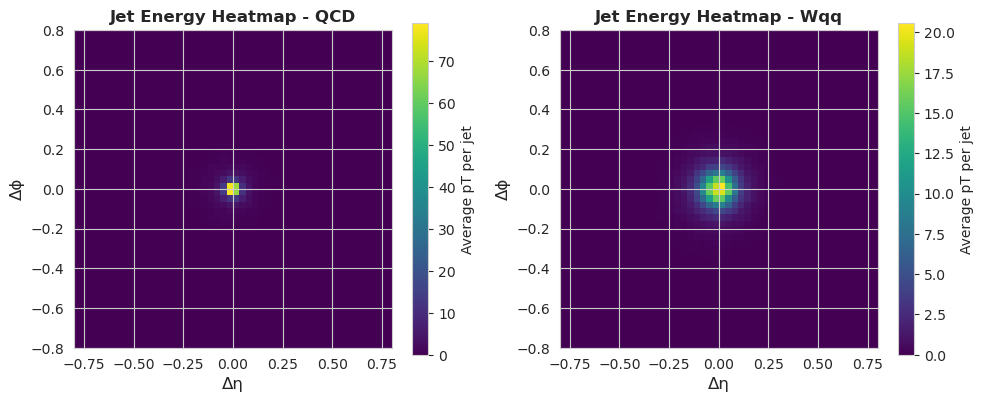

In [ ]:
# Probar la función corregida
print("Probando función corregida para QCD vs Wqq...")
create_jet_energy_heatmaps_fixed(path_file, labels_filter=['label_QCD', 'label_Wqq'])


In [ ]:
# FUNCIÓN CORREGIDA PARA PERFIL RADIAL - Calcula pT desde px, py
def create_radial_energy_profiles_fixed(path_file, labels_filter=None, bins=50):
    """
    Crea perfiles radiales de energía para cada clase de jet
    CORREGIDA: Calcula pT a partir de px y py
    
    Args:
        path_file: ruta para guardar las imágenes
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
        bins: número de bins para el histograma radial
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            if hasattr(table, label):
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Obtener índices de jets filtrados
        filtered_jet_indices = np.where(label_mask)[0]
        
        print(f"Datos filtrados: {len(filtered_jet_indices)} jets")
        
    else:
        # Sin filtro - usar todos los datos
        filtered_jet_indices = np.arange(len(table))
        print(f"Datos completos: {len(filtered_jet_indices)} jets")
    
    # Crear figura
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    # Colores para las etiquetas
    colors = plt.cm.Set3(np.linspace(0, 1, len(labels_filter) if labels_filter else len(np.unique(table["labels"]))))
    
    # Rango radial máximo
    max_dr = 0.8
    
    # Procesar cada label
    for i, label in enumerate(labels_filter if labels_filter else ['all']):
        # Filtrar datos para esta clase específica
        all_dr = []
        all_pt = []
        
        for jet_idx in filtered_jet_indices:
            # Verificar si este jet pertenece a la clase actual
            if labels_filter:
                jet_belongs_to_class = False
                for target_label in labels_filter:
                    if hasattr(table, target_label) and np.array(table[target_label])[jet_idx] == 1:
                        if target_label == label:
                            jet_belongs_to_class = True
                        break
                
                if not jet_belongs_to_class:
                    continue
            
            # Obtener datos de partículas de este jet
            jet_deta = np.array(table['part_deta'][jet_idx])
            jet_dphi = np.array(table['part_dphi'][jet_idx])
            
            # Calcular pT a partir de px y py
            jet_px = np.array(table['part_px'][jet_idx])
            jet_py = np.array(table['part_py'][jet_idx])
            jet_pt = np.sqrt(jet_px**2 + jet_py**2)
            
            # Calcular ΔR = sqrt(Δη² + Δϕ²)
            jet_dr = np.sqrt(jet_deta**2 + jet_dphi**2)
            
            all_dr.extend(jet_dr)
            all_pt.extend(jet_pt)
        
        all_dr = np.array(all_dr)
        all_pt = np.array(all_pt)
        
        if len(all_dr) > 0:
            # Crear histograma ponderado por pT
            hist, bin_edges = np.histogram(all_dr, bins=bins, range=(0, max_dr), weights=all_pt)
            
            # Normalizar por el número de jets de esta clase
            n_jets = len([idx for idx in filtered_jet_indices 
                         if labels_filter and hasattr(table, label) and np.array(table[label])[idx] == 1])
            if n_jets == 0:
                n_jets = len(filtered_jet_indices)
            
            hist_normalized = hist / n_jets
            
            # Calcular centros de bins
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            
            # Graficar perfil radial
            ax.plot(bin_centers, hist_normalized, 
                   label=f'{label.replace("label_", "")} (n={n_jets})', 
                   color=colors[i], linewidth=2.5, alpha=0.8)
            
            # También agregar área sombreada
            ax.fill_between(bin_centers, hist_normalized, alpha=0.3, color=colors[i])
            
            print(f"{label.replace('label_', '')}: {n_jets} jets, {len(all_dr)} particles")
    
    ax.set_xlabel('ΔR (Radial Distance)', fontsize=12)
    ax.set_ylabel('Average pT per jet', fontsize=12)
    ax.set_title('Radial Energy Profiles by Jet Class', fontsize=14, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(0, max_dr)
    
    plt.tight_layout()
    
    # Guardar
    filename_suffix = f"_{'_'.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    plt.savefig(f"{path_file}/radial_energy_profiles{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


In [ ]:
# FUNCIÓN MAESTRA CORREGIDA PARA TODAS LAS VISUALIZACIONES AVANZADAS
def generate_all_advanced_jet_visualizations_fixed(path_file, labels_filter=None):
    """
    Genera todas las visualizaciones avanzadas de jets: heatmaps, contornos de densidad y perfiles radiales
    CORREGIDA: Calcula pT a partir de px y py
    
    Args:
        path_file: ruta para guardar las imágenes
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
    """
    import os
    
    print("🚀 GENERANDO VISUALIZACIONES AVANZADAS DE JETS (CORREGIDAS)")
    print("="*60)
    
    # Crear directorio para las visualizaciones avanzadas
    advanced_dir = f"{path_file}/advanced_jet_visualizations"
    os.makedirs(advanced_dir, exist_ok=True)
    
    # 1. Histogramas 2D de Energía (Heatmaps)
    print("\n📊 1. Generando Histogramas 2D de Energía (Heatmaps)...")
    create_jet_energy_heatmaps_fixed(advanced_dir, labels_filter=labels_filter, bins=50)
    
    # 2. Gráficos de Densidad 2D (KDE Contours)
    #print("\n🌊 2. Generando Gráficos de Densidad 2D (KDE Contours)...")
    #create_jet_density_contours_fixed(advanced_dir, labels_filter=labels_filter, levels=10)
    
    # 3. Perfil Radial de Energía
    print("\n📈 3. Generando Perfil Radial de Energía...")
    create_radial_energy_profiles_fixed(advanced_dir, labels_filter=labels_filter, bins=50)
    
    print("\n" + "="*60)
    print("✅ TODAS LAS VISUALIZACIONES AVANZADAS COMPLETADAS!")
    print(f"📁 Resultados guardados en: {advanced_dir}")
    print("="*60)
    
    # Mostrar resumen de archivos generados
    print("\n📋 ARCHIVOS GENERADOS:")
    files_generated = [
        "jet_energy_heatmaps*.png",
        "jet_density_contours*.png", 
        "radial_energy_profiles*.png"
    ]
    
    for file_pattern in files_generated:
        print(f"  • {file_pattern}")
    
    print("\n💡 INTERPRETACIÓN:")
    print("  • Heatmaps: Muestran la distribución promedio de energía en el espacio Δη-Δϕ")
    print("  • Contornos KDE: Visualización suave de las regiones de alta densidad")
    print("  • Perfiles Radiales: Cómo se distribuye la energía desde el centro del jet")
    print("\n🔍 DIFERENCIAS ESPERADAS:")
    print("  • Jets W/Z/H: Estructura 'two-prong' o 'three-prong'")
    print("  • Jets QCD: Estructura más cónica y centrada")
    print("  • Perfiles radiales: Jets de señal más anchos, QCD más estrechos")


Probando función maestra corregida para QCD vs Wqq...
🚀 GENERANDO VISUALIZACIONES AVANZADAS DE JETS (CORREGIDAS)

📊 1. Generando Histogramas 2D de Energía (Heatmaps)...
Filtrando por labels: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 jets
QCD: 10000 jets, 352365 particles
Wqq: 10000 jets, 322453 particles


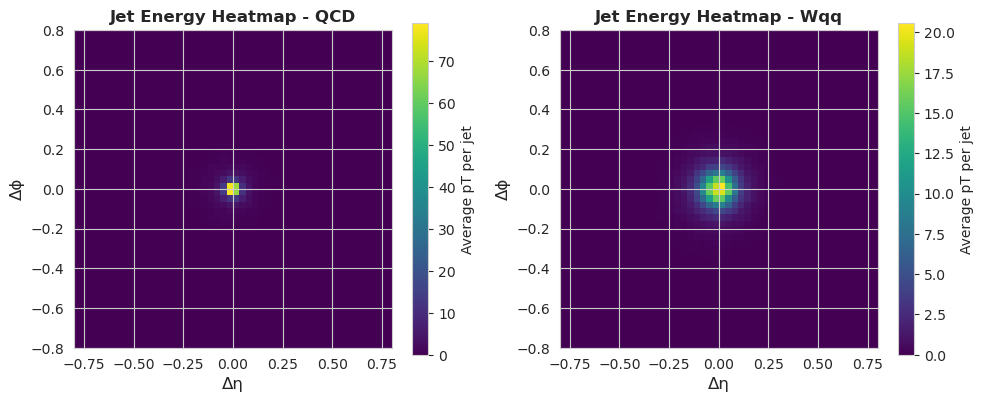


📈 3. Generando Perfil Radial de Energía...
Filtrando por labels: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 jets
QCD: 10000 jets, 352365 particles
Wqq: 10000 jets, 322453 particles


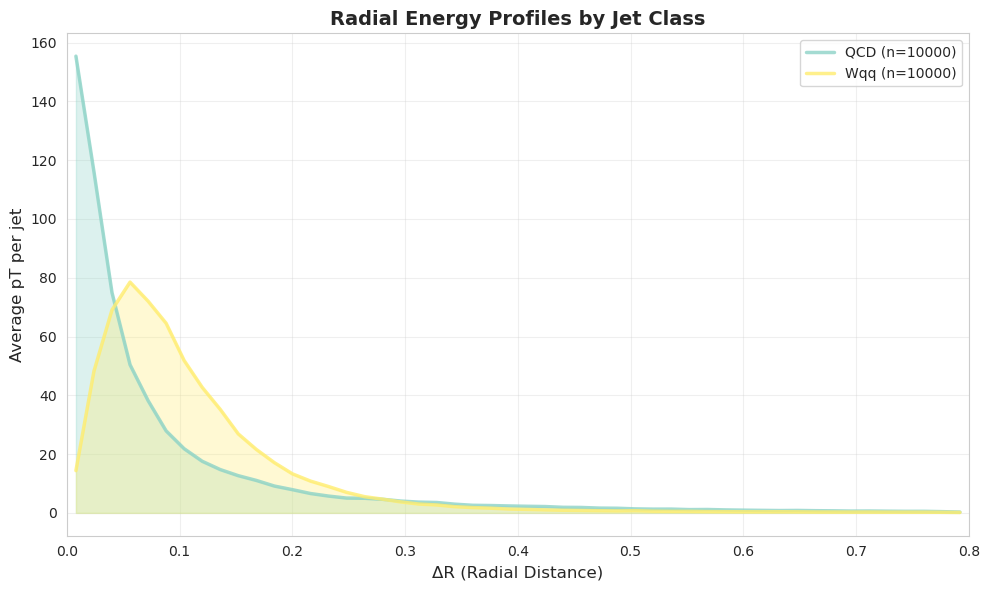


✅ TODAS LAS VISUALIZACIONES AVANZADAS COMPLETADAS!
📁 Resultados guardados en: /home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots//advanced_jet_visualizations

📋 ARCHIVOS GENERADOS:
  • jet_energy_heatmaps*.png
  • jet_density_contours*.png
  • radial_energy_profiles*.png

💡 INTERPRETACIÓN:
  • Heatmaps: Muestran la distribución promedio de energía en el espacio Δη-Δϕ
  • Contornos KDE: Visualización suave de las regiones de alta densidad
  • Perfiles Radiales: Cómo se distribuye la energía desde el centro del jet

🔍 DIFERENCIAS ESPERADAS:
  • Jets W/Z/H: Estructura 'two-prong' o 'three-prong'
  • Jets QCD: Estructura más cónica y centrada
  • Perfiles radiales: Jets de señal más anchos, QCD más estrechos


In [ ]:
# Probar la función maestra corregida
print("Probando función maestra corregida para QCD vs Wqq...")
generate_all_advanced_jet_visualizations_fixed(path_file, labels_filter=['label_QCD', 'label_Wqq'])


In [ ]:
# Función para iterar sobre todas las combinaciones de QCD con otros labels
def generate_all_qcd_comparisons(features_list, path_file, bins=50, alpha=0.6):
    """
    Genera histogramas y pairplots para todas las combinaciones de QCD con otros labels
    
    Args:
        features_list: lista de features a graficar
        path_file: ruta para guardar las imágenes
        bins: número de bins para los histogramas
        alpha: transparencia de los histogramas
    """
    import os
    
    # Obtener todos los labels disponibles (excluyendo QCD)
    all_labels = []
    for key in dir(table):
        if key.startswith('label_') and key != 'label_QCD':
            all_labels.append(key)
    
    print(f"Labels encontrados (excluyendo QCD): {all_labels}")
    
    # Crear directorio para guardar los resultados
    comparison_dir = f"{path_file}/qcd_comparisons"
    os.makedirs(comparison_dir, exist_ok=True)
    
    # Iterar sobre cada combinación QCD + otro label
    for other_label in all_labels:
        print(f"\n{'='*50}")
        print(f"Generando comparación: QCD vs {other_label}")
        print(f"{'='*50}")
        
        # Crear subdirectorio para esta comparación
        label_name = other_label.replace('label_', '')
        subdir = f"{comparison_dir}/QCD_vs_{label_name}"
        os.makedirs(subdir, exist_ok=True)
        
        # Generar histogramas
        print(f"Generando histogramas para QCD vs {label_name}...")
        hist_feature_comparison_subplots_advanced(
            features_list, subdir, 
            bins=bins, alpha=alpha,
            labels_filter=['label_QCD', other_label]
        )
        
        # Generar pairplot (solo para las primeras 4 features para evitar sobrecarga)
        # print(f"Generando pairplot para QCD vs {label_name}...")
        # create_jet_features_pairplot_advanced(
        #     subdir,
        #     features_subset=features_list[:4],  # Solo las primeras 4 features
        #     labels_filter=['label_QCD', other_label]
        # )
        
        print(f"✅ Completado: QCD vs {label_name}")
    
    print(f"\n{'='*50}")
    print(f"🎉 Todas las comparaciones completadas!")
    print(f"📁 Resultados guardados en: {comparison_dir}")
    print(f"{'='*50}")


Labels encontrados (excluyendo QCD): ['label_H4q', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_Hqql', 'label_Tbl', 'label_Tbqq', 'label_Wqq', 'label_Zqq']

Generando comparación: QCD vs label_H4q
Generando histogramas para QCD vs H4q...
Filtrando por labels: ['label_QCD', 'label_H4q']
Datos filtrados: 20000 muestras
Labels únicos: ['H4q' 'QCD']
jet_tau1 - H4q: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - H4q: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - H4q: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - H4q: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - H4q: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - H4q: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - H4q: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - H4q: 10000 eventos
jet_nparticles - QCD: 10000 eventos


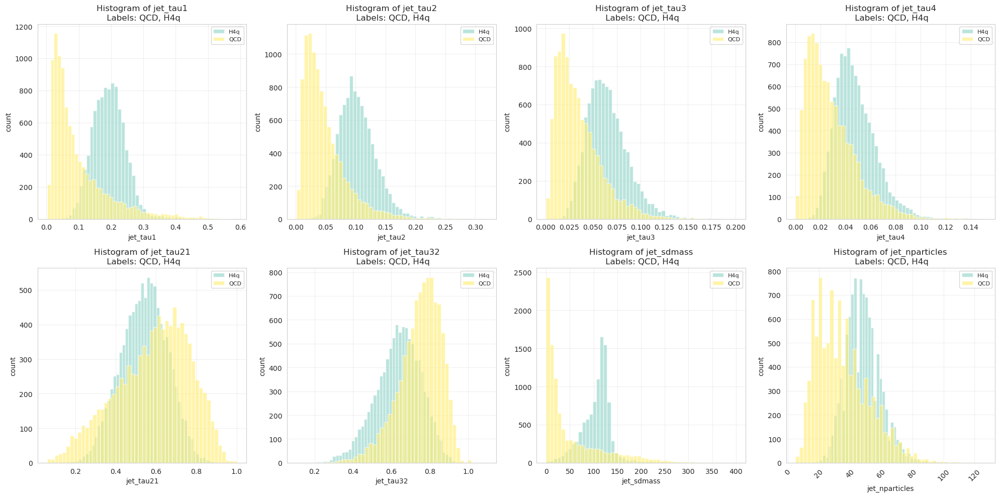

✅ Completado: QCD vs H4q

Generando comparación: QCD vs label_Hbb
Generando histogramas para QCD vs Hbb...
Filtrando por labels: ['label_QCD', 'label_Hbb']
Datos filtrados: 20000 muestras
Labels únicos: ['Hbb' 'QCD']
jet_tau1 - Hbb: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hbb: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hbb: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hbb: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hbb: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hbb: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hbb: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hbb: 10000 eventos
jet_nparticles - QCD: 10000 eventos


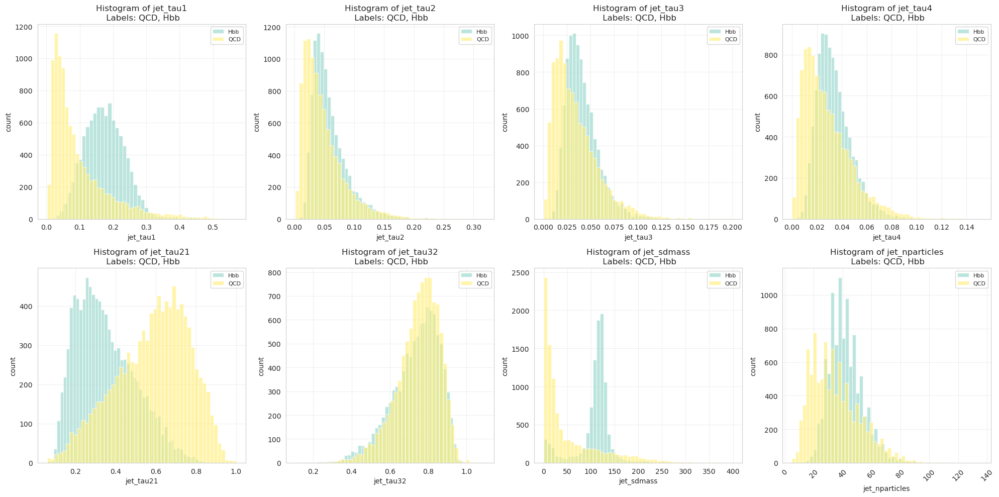

✅ Completado: QCD vs Hbb

Generando comparación: QCD vs label_Hcc
Generando histogramas para QCD vs Hcc...
Filtrando por labels: ['label_QCD', 'label_Hcc']
Datos filtrados: 20000 muestras
Labels únicos: ['Hcc' 'QCD']
jet_tau1 - Hcc: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hcc: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hcc: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hcc: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hcc: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hcc: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hcc: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hcc: 10000 eventos
jet_nparticles - QCD: 10000 eventos


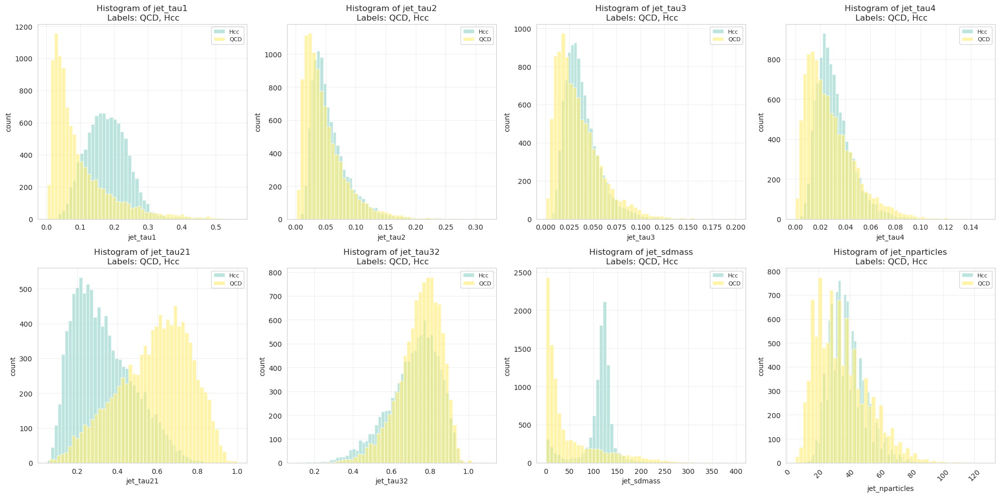

✅ Completado: QCD vs Hcc

Generando comparación: QCD vs label_Hgg
Generando histogramas para QCD vs Hgg...
Filtrando por labels: ['label_QCD', 'label_Hgg']
Datos filtrados: 20000 muestras
Labels únicos: ['Hgg' 'QCD']
jet_tau1 - Hgg: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hgg: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hgg: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hgg: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hgg: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hgg: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hgg: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hgg: 10000 eventos
jet_nparticles - QCD: 10000 eventos


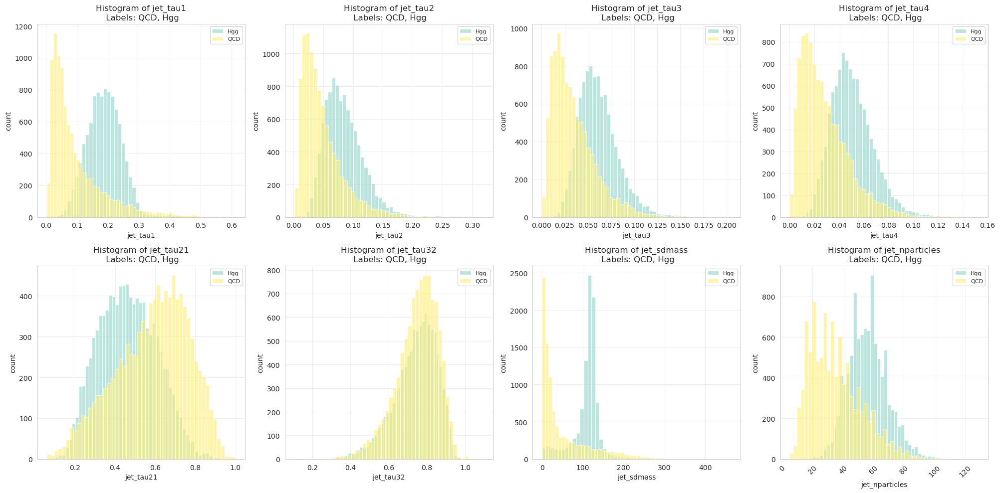

✅ Completado: QCD vs Hgg

Generando comparación: QCD vs label_Hqql
Generando histogramas para QCD vs Hqql...
Filtrando por labels: ['label_QCD', 'label_Hqql']
Datos filtrados: 20000 muestras
Labels únicos: ['Hqql' 'QCD']
jet_tau1 - Hqql: 10000 eventos
jet_tau1 - QCD: 10000 eventos
jet_tau2 - Hqql: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau3 - Hqql: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau4 - Hqql: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau21 - Hqql: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau32 - Hqql: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_sdmass - Hqql: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_nparticles - Hqql: 10000 eventos
jet_nparticles - QCD: 10000 eventos


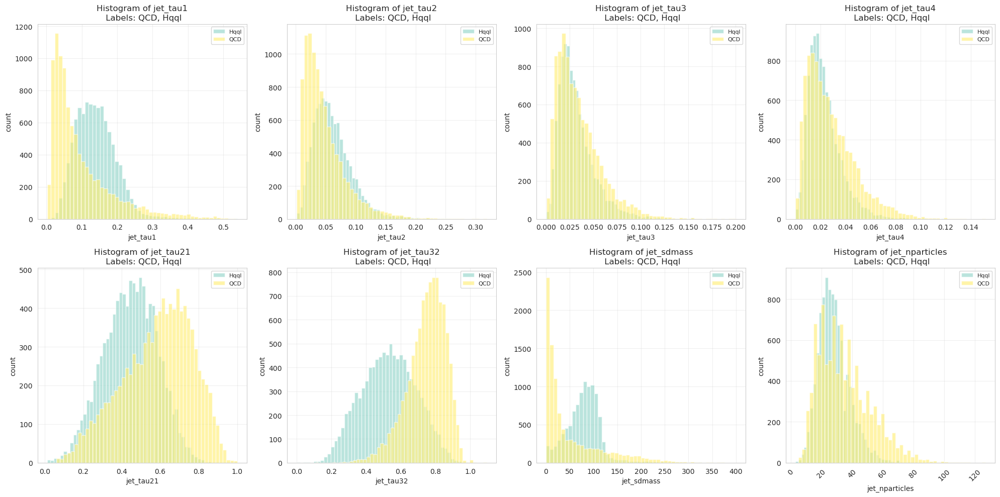

✅ Completado: QCD vs Hqql

Generando comparación: QCD vs label_Tbl
Generando histogramas para QCD vs Tbl...
Filtrando por labels: ['label_QCD', 'label_Tbl']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Tbl']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Tbl: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Tbl: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Tbl: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Tbl: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Tbl: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Tbl: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Tbl: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Tbl: 10000 eventos


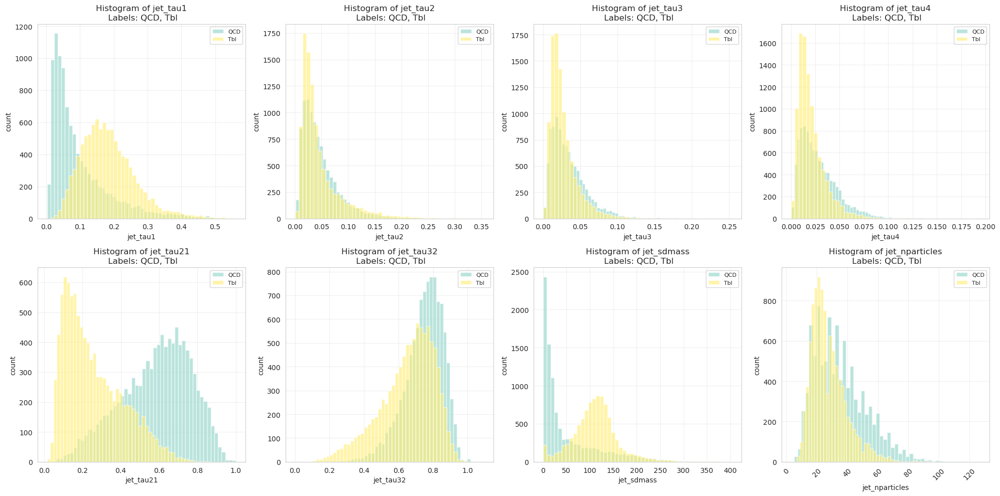

✅ Completado: QCD vs Tbl

Generando comparación: QCD vs label_Tbqq
Generando histogramas para QCD vs Tbqq...
Filtrando por labels: ['label_QCD', 'label_Tbqq']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Tbqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Tbqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Tbqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Tbqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Tbqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Tbqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Tbqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Tbqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Tbqq: 10000 eventos


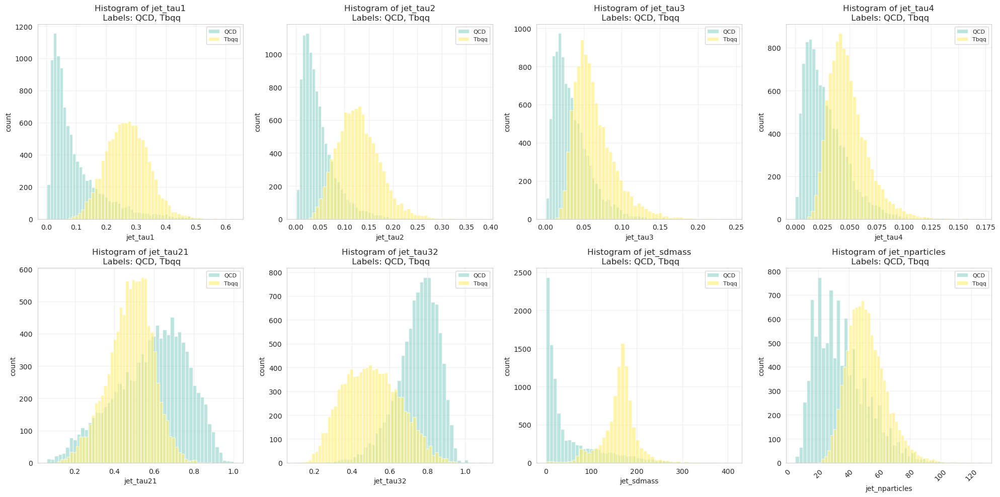

✅ Completado: QCD vs Tbqq

Generando comparación: QCD vs label_Wqq
Generando histogramas para QCD vs Wqq...
Filtrando por labels: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Wqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Wqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Wqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Wqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Wqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Wqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Wqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Wqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Wqq: 10000 eventos


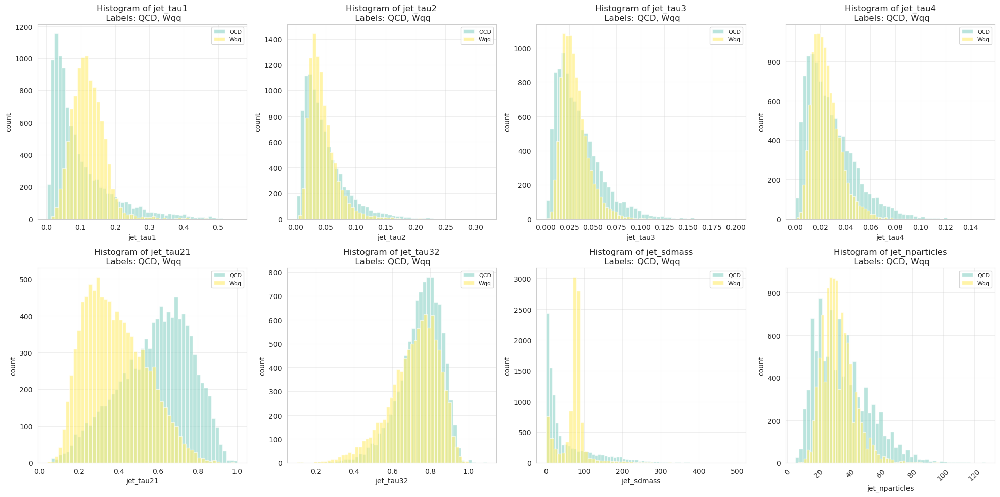

✅ Completado: QCD vs Wqq

Generando comparación: QCD vs label_Zqq
Generando histogramas para QCD vs Zqq...
Filtrando por labels: ['label_QCD', 'label_Zqq']
Datos filtrados: 20000 muestras
Labels únicos: ['QCD' 'Zqq']
jet_tau1 - QCD: 10000 eventos
jet_tau1 - Zqq: 10000 eventos
jet_tau2 - QCD: 10000 eventos
jet_tau2 - Zqq: 10000 eventos
jet_tau3 - QCD: 10000 eventos
jet_tau3 - Zqq: 10000 eventos
jet_tau4 - QCD: 10000 eventos
jet_tau4 - Zqq: 10000 eventos
jet_tau21 - QCD: 10000 eventos
jet_tau21 - Zqq: 10000 eventos
jet_tau32 - QCD: 10000 eventos
jet_tau32 - Zqq: 10000 eventos
jet_sdmass - QCD: 10000 eventos
jet_sdmass - Zqq: 10000 eventos
jet_nparticles - QCD: 10000 eventos
jet_nparticles - Zqq: 10000 eventos


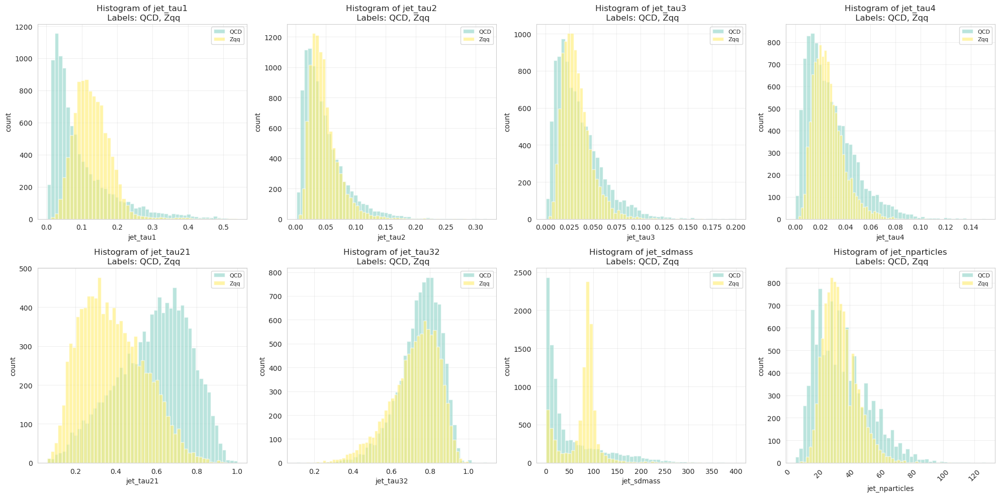

✅ Completado: QCD vs Zqq

🎉 Todas las comparaciones completadas!
📁 Resultados guardados en: /home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots//qcd_comparisons


In [ ]:
# Ejemplo de uso: Generar todas las comparaciones QCD vs otros labels

# Definir las features que quieres graficar
jet_features = ['jet_tau1', 'jet_tau2', 'jet_tau3', 'jet_tau4',
                'jet_tau21', 'jet_tau32','jet_sdmass', 'jet_nparticles', ]

# Generar todas las comparaciones automáticamente
generate_all_qcd_comparisons(jet_features, path_file, bins=50, alpha=0.6)


Acá ya es un objeto que contiene el 4-momentum para cada particula, vectorizado. cada corchete es una particula.

In [ ]:
p4[99999]

<MomentumArray4D [{x: -122, y: -120, z: -161, ...}, ...] type='42 * Momentu...'>

In [ ]:
# Get the transverse momentum (pt)
# Cada valor es el pt de cada partícula, por ejemplo en el primero len(p4.pt[0]) =  38 = numero particulas
p4.pt

<Array [[140, 95.3, 87.8, ..., 1.24, 1.2], ...] type='100000 * var * float32'>

In [ ]:
# Get the pseudorapidity (eta)
p4.eta

<Array [[-0.254, -0.403, ..., -0.428], ...] type='100000 * var * float32'>

In [ ]:
# Get the azimuth angle (phi)
p4.phi

<Array [[2.67, 2.84, 2.81, ..., 2.85, 2.84], ...] type='100000 * var * float32'>

In [ ]:
def _pad(a, maxlen, value=0, dtype='float32'):
    if isinstance(a, np.ndarray) and a.ndim >= 2 and a.shape[1] == maxlen:
        return a
    elif isinstance(a, ak.Array):
        if a.ndim == 1:
            a = ak.unflatten(a, 1)
        a = ak.fill_none(ak.pad_none(a, maxlen, clip=True), value)
        return ak.values_astype(a, dtype)
    else:
        x = (np.ones((len(a), maxlen)) * value).astype(dtype)
        for idx, s in enumerate(a):
            if not len(s):
                continue
            trunc = s[:maxlen].astype(dtype)
            x[idx, :len(trunc)] = trunc
        return x

In [ ]:
# Apply zero-padding and convert to a numpy array
array_test = _pad(p4.pt, maxlen=128).to_numpy()

In [ ]:
array_test

array([[140.19296 ,  95.284584,  87.84807 , ...,   0.      ,   0.      ,
          0.      ],
       [244.67009 ,  62.332603,  45.159416, ...,   0.      ,   0.      ,
          0.      ],
       [143.15791 ,  91.48589 ,  25.372644, ...,   0.      ,   0.      ,
          0.      ],
       ...,
       [157.69547 , 101.245445,  79.816284, ...,   0.      ,   0.      ,
          0.      ],
       [ 88.65814 ,  80.69194 ,  79.14036 , ...,   0.      ,   0.      ,
          0.      ],
       [171.13641 , 121.71926 ,  59.68036 , ...,   0.      ,   0.      ,
          0.      ]], dtype=float32)

In [ ]:
array_test.shape

(100000, 128)

# Constructing features and labels

As you see previously with `tree.show()`, there are four groups of arrays with different prefixes:
 - `part_*`: JaggedArrays with features for each particle in a jet. These (and features constrcuted from them) are what we use for training in the Particle Transformer paper.
 - `label_*`: 1D numpy arrays one-hot truth labels for each jet. These are the target of the training.
 - *[Not used in the Particle Transformer paper]* `jet_*`: 1D numpy array with (high-level) features for each jet. These can also be used in the training, but since they are constructed from the particle-level features, it is not expected that they bring additional performance improvement.
 - *[Not used in the Particle Transformer paper]* `aux_*`: auxiliary truth information about the simulated particles for additional studies / interpretations. **SHOULD NOT be used in the training of any classifier.**

The code below illustrates how the input features and labels are constructed in the Particle Transformer paper.

(See also the yaml configuration: https://github.com/jet-universe/particle_transformer/blob/main/data/JetClass/JetClass_full.yaml)

In [77]:
def _clip(a, a_min, a_max):
    try:
        return np.clip(a, a_min, a_max)
    except ValueError:
        return ak.unflatten(np.clip(ak.flatten(a), a_min, a_max), ak.num(a))

In [78]:
def build_features_and_labels(tree, transform_features=True):
    
    # load arrays from the tree
    a = tree.arrays(filter_name=['part_*', 'jet_pt', 'jet_energy', 'label_*'])

    # compute new features
    a['part_mask'] = ak.ones_like(a['part_energy'])
    a['part_pt'] = np.hypot(a['part_px'], a['part_py'])
    a['part_pt_log'] = np.log(a['part_pt'])
    a['part_e_log'] = np.log(a['part_energy'])
    a['part_logptrel'] = np.log(a['part_pt']/a['jet_pt'])
    a['part_logerel'] = np.log(a['part_energy']/a['jet_energy'])
    a['part_deltaR'] = np.hypot(a['part_deta'], a['part_dphi'])
    a['part_d0'] = np.tanh(a['part_d0val'])
    a['part_dz'] = np.tanh(a['part_dzval'])

    # apply standardization
    if transform_features:
        a['part_pt_log'] = (a['part_pt_log'] - 1.7) * 0.7
        a['part_e_log'] = (a['part_e_log'] - 2.0) * 0.7
        a['part_logptrel'] = (a['part_logptrel'] - (-4.7)) * 0.7
        a['part_logerel'] = (a['part_logerel'] - (-4.7)) * 0.7
        a['part_deltaR'] = (a['part_deltaR'] - 0.2) * 4.0
        a['part_d0err'] = _clip(a['part_d0err'], 0, 1)
        a['part_dzerr'] = _clip(a['part_dzerr'], 0, 1)

    feature_list = {
        'pf_points': ['part_deta', 'part_dphi'], # not used in ParT
        'pf_features': [
            'part_pt_log', 
            'part_e_log',
            'part_logptrel',
            'part_logerel',
            'part_deltaR',
            'part_charge',
            'part_isChargedHadron',
            'part_isNeutralHadron',
            'part_isPhoton',
            'part_isElectron',
            'part_isMuon',
            'part_d0',
            'part_d0err',
            'part_dz',
            'part_dzerr',
            'part_deta',
            'part_dphi',
        ],
        'pf_vectors': [
            'part_px',
            'part_py',
            'part_pz',
            'part_energy',
        ],
        'pf_mask': ['part_mask']
    }

    out = {}
    for k, names in feature_list.items():
        out[k] = np.stack([_pad(a[n], maxlen=128).to_numpy() for n in names], axis=1)

    label_list = ['label_QCD', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_H4q', 'label_Hqql', 'label_Zqq', 'label_Wqq', 'label_Tbqq', 'label_Tbl']
    out['label'] = np.stack([a[n].to_numpy().astype('int') for n in label_list], axis=1)
    
    return out

In [79]:
build_features_and_labels(tree)

{'pf_points': array([[[-0.07242048,  0.07607916,  0.08601749, ...,  0.        ,
           0.        ,  0.        ],
         [-0.08581114,  0.09253383,  0.06340456, ...,  0.        ,
           0.        ,  0.        ]],
 
        [[ 0.01535046, -0.00294232,  0.03290105, ...,  0.        ,
           0.        ,  0.        ],
         [-0.04896092, -0.04723394, -0.06385756, ...,  0.        ,
           0.        ,  0.        ]],
 
        [[-0.13630104, -0.14928365, -0.17035806, ...,  0.        ,
           0.        ,  0.        ],
         [-0.01668766, -0.02666983, -0.01680285, ...,  0.        ,
           0.        ,  0.        ]],
 
        ...,
 
        [[ 0.07362503,  0.09081   , -0.15697095, ...,  0.        ,
           0.        ,  0.        ],
         [ 0.01177871,  0.02063447, -0.01410705, ...,  0.        ,
           0.        ,  0.        ]],
 
        [[ 0.03936064,  0.04921722,  0.03772318, ...,  0.        ,
           0.        ,  0.        ],
         [ 0.04601908,  

In [80]:
build_features_and_labels(tree)['label'].shape

(100000, 10)

In [81]:
build_features_and_labels(tree)['pf_features'].shape

(100000, 17, 128)

In [82]:
build_features_and_labels(tree)['pf_mask'].shape


(100000, 1, 128)

In [83]:
features_and_labels = build_features_and_labels(tree)

In [84]:
type(features_and_labels)

dict

In [85]:
features_and_labels.keys()

dict_keys(['pf_points', 'pf_features', 'pf_vectors', 'pf_mask', 'label'])

In [86]:
features_and_labels['pf_features'].shape

(100000, 17, 128)

### Create features and vectors metadata

In [87]:
feature_list = {
        'pf_points': ['part_deta', 'part_dphi'], # not used in ParT
        'pf_features': [
            'part_pt_log', 
            'part_e_log',
            'part_logptrel',
            'part_logerel',
            'part_deltaR',
            'part_charge',
            'part_isChargedHadron',
            'part_isNeutralHadron',
            'part_isPhoton',
            'part_isElectron',
            'part_isMuon',
            'part_d0',
            'part_d0err',
            'part_dz',
            'part_dzerr',
            'part_deta',
            'part_dphi',
        ],
        'pf_vectors': [
            'part_px',
            'part_py',
            'part_pz',
            'part_energy',
        ],
        'pf_mask': ['part_mask']
    }

In [88]:
len(feature_list['pf_features'])

17

In [89]:
features_metadata_index = {}

for i, feat in enumerate(feature_list['pf_features']):
    features_metadata_index[feat] = i

features_metadata_index

{'part_pt_log': 0,
 'part_e_log': 1,
 'part_logptrel': 2,
 'part_logerel': 3,
 'part_deltaR': 4,
 'part_charge': 5,
 'part_isChargedHadron': 6,
 'part_isNeutralHadron': 7,
 'part_isPhoton': 8,
 'part_isElectron': 9,
 'part_isMuon': 10,
 'part_d0': 11,
 'part_d0err': 12,
 'part_dz': 13,
 'part_dzerr': 14,
 'part_deta': 15,
 'part_dphi': 16}

In [90]:
vectors_metadata_index = {}

for i, feat in enumerate(feature_list['pf_vectors']):
    vectors_metadata_index[feat] = i

vectors_metadata_index

{'part_px': 0, 'part_py': 1, 'part_pz': 2, 'part_energy': 3}

### Plot jets

In [91]:
def plot_jets_single(input_jet_label):

    mask = table['labels'] == input_jet_label

    # Crear un gráfico
    plt.figure()

    # Obtener las características y etiquetas
    features = build_features_and_labels(tree)['pf_features'][mask][0] ### Este [0] es porque se eligió el jet 0 de cada tipo para graficar

    energy = build_features_and_labels(tree)['pf_vectors'][mask][0][-1]

    x_np = features[-2]  # delta eta
    y_np = features[-1]  # delta phi
    sizes = energy  # Tamaños
    fills = features[5]  # Relleno. solid for electrically charged particles, hollow for neutral particles

    isChargedHadron = features[6]
    isNeutralHadron = features[7]
    isPhoton = features[8]
    isElectron = features[9]
    isMuon = features[10]
    trajec_disp = features[11]  # Trajectory displacement These measurements are only available for electrically charged particles, and a value of 0 is used for neutral particles.

    # Normalizar trajec_disp para que esté en el rango [0, 1]
    norm = colors.Normalize(vmin=min(trajec_disp), vmax=max(trajec_disp))
    green_colors = plt.cm.Greens(norm(trajec_disp))  # Escala de verde

    # Diccionario para los tipos de partículas y sus propiedades de graficación
    particle_types = {
        'is_hadron': {'condition': lambda i: isChargedHadron[i] == 1 or isNeutralHadron[i] == 1, 'marker': 'o', 'label_added': False},
        'is_photon': {'condition': lambda i: isPhoton[i] == 1, 'marker': 'p', 'label_added': False},
        'is_electron': {'condition': lambda i: isElectron[i] == 1, 'marker': '^', 'label_added': False},
        'is_muon': {'condition': lambda i: isMuon[i] == 1, 'marker': 'v', 'label_added': False},
        'is_bg': {'condition': lambda i: True, 'marker': 's', 'label_added': False}
    }

    # Graficar puntos con símbolos diferentes según su clasificación
    for i in range(len(x_np)):
        for label, props in particle_types.items():
            if props['condition'](i):
                plt.scatter(
                    x_np[i], y_np[i], 
                    s=sizes[i], 
                    marker=props['marker'], 
                    label=label if not props['label_added'] else "",  # Solo añade la etiqueta si no ha sido añadida
                    facecolors='none' if fills[i] == 0 else green_colors[i], 
                    edgecolors=green_colors[i]
                )
                props['label_added'] = True  # Marca la etiqueta como añadida
                break

    # Añadir leyenda
    #plt.legend()

    # Añadir títulos y etiquetas
    plt.title('{}'.format(input_jet_label))
    plt.xlabel(r'$\Delta \eta$')  # Delta eta
    plt.ylabel(r'$\Delta \phi$')  # Delta phi
    plt.xlim(-0.5,0.5)
    plt.ylim(-0.5,0.5)

    # Mostrar gráfico
    plt.show()

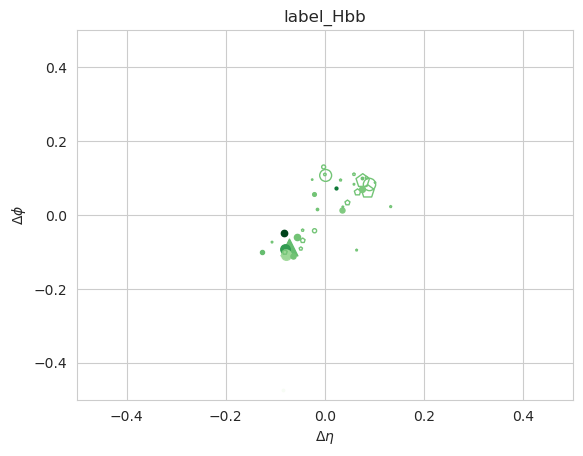

In [92]:
plot_jets_single('label_Hbb')

In [93]:
# label_list = ['label_QCD', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_H4q', 'label_Hqql', 'label_Zqq', 'label_Wqq', 'label_Tbqq', 'label_Tbl']

# for i in range(len(label_list)):
#     print(label_list[i])
#     plot_jets(label_list[i])
#     plt.show()
#     plt.savefig(f'/home/catalinariano/Documentos/tesis_maestria/EDA_jets/{label_list[i]}.png')

In [94]:
def plot_jets_all(input_jet_label, ax):
    mask = table['labels'] == input_jet_label
    features = build_features_and_labels(tree)['pf_features'][mask][0]  # Jet 0 de cada tipo
    energy = build_features_and_labels(tree)['pf_vectors'][mask][0][-1]
    x_np = features[-2]  # delta eta
    y_np = features[-1]  # delta phi
    sizes = energy
    fills = features[5]
    isChargedHadron = features[6]
    isNeutralHadron = features[7]
    isPhoton = features[8]
    isElectron = features[9]
    isMuon = features[10]
    trajec_disp = features[11]
    norm = colors.Normalize(vmin=min(trajec_disp), vmax=max(trajec_disp))
    green_colors = plt.cm.Greens(norm(trajec_disp))
    particle_types = {
        'is_hadron': {'condition': lambda i: isChargedHadron[i] == 1 or isNeutralHadron[i] == 1, 'marker': 'o', 'label_added': False},
        'is_photon': {'condition': lambda i: isPhoton[i] == 1, 'marker': 'p', 'label_added': False},
        'is_electron': {'condition': lambda i: isElectron[i] == 1, 'marker': '^', 'label_added': False},
        'is_muon': {'condition': lambda i: isMuon[i] == 1, 'marker': 'v', 'label_added': False},
        'is_bg': {'condition': lambda i: True, 'marker': 's', 'label_added': False}
    }
    for i in range(len(x_np)):
        for label, props in particle_types.items():
            if props['condition'](i):
                ax.scatter(
                    x_np[i], y_np[i],
                    s=sizes[i],
                    marker=props['marker'],
                    label=label if not props['label_added'] else "",
                    facecolors='none' if fills[i] == 0 else green_colors[i],
                    edgecolors=green_colors[i]
                )
                props['label_added'] = True
                break
    ax.set_title('{}'.format(input_jet_label))
    ax.set_xlabel(r'$\Delta \eta$')
    ax.set_ylabel(r'$\Delta \phi$')
    ax.set_xlim(-0.5, 0.5)
    ax.set_ylim(-0.5, 0.5)
    #ax.legend()

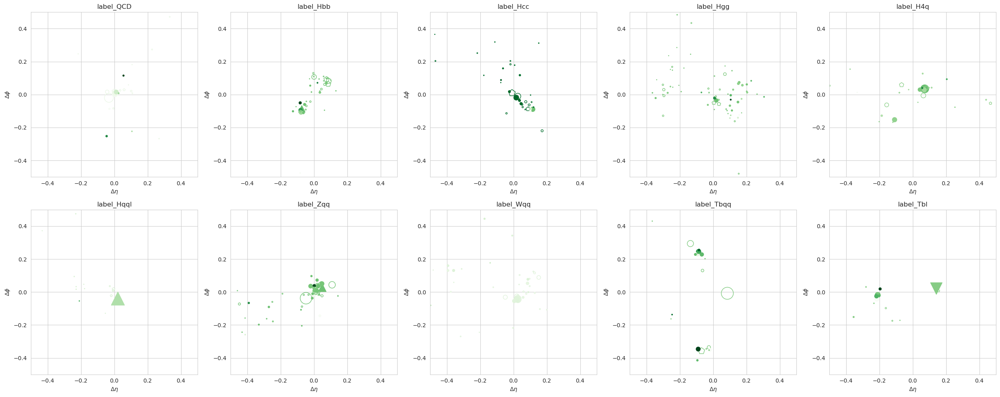

In [96]:
#path_file = '/home/catalinariano/Documentos/particle_transformer-main/notebooks/EDA_plots/'

path_file = os.getcwd() + os.sep + 'EDA_plots' + os.sep

# Crear figura con 10 subplots (2x5)
fig, axs = plt.subplots(2, 5, figsize=(25, 10))
label_list = ['label_QCD', 'label_Hbb', 'label_Hcc', 'label_Hgg', 'label_H4q', 'label_Hqql', 'label_Zqq', 'label_Wqq', 'label_Tbqq', 'label_Tbl']
for i, label in enumerate(label_list):
    ax = axs[i // 5, i % 5]
    plot_jets_all(label, ax)
plt.tight_layout()

#plt.savefig(path_file + 'all_jet_rep.png')
plt.show()

Histograms para las variables construidas

In [97]:
def hist_feature_comparison(feature, path_file):

    jet_feat = table[feature]
    labels = table["labels"]
    
    for i, label in enumerate(unique_labels):
        mask = labels == label
        #print(jet_feat[mask])
        plt.hist(jet_feat[mask], bins=100 , alpha = 0.5, label = {label} )

    plt.xlabel('{}'.format(feature))
    plt.ylabel('count')
    plt.title('Histogram of {}'.format(feature))
    plt.legend()

    plt.tight_layout()
    plt.savefig(path_file + f'{feature}_plot.png')
    plt.show()

In [98]:
feature_list

{'pf_points': ['part_deta', 'part_dphi'],
 'pf_features': ['part_pt_log',
  'part_e_log',
  'part_logptrel',
  'part_logerel',
  'part_deltaR',
  'part_charge',
  'part_isChargedHadron',
  'part_isNeutralHadron',
  'part_isPhoton',
  'part_isElectron',
  'part_isMuon',
  'part_d0',
  'part_d0err',
  'part_dz',
  'part_dzerr',
  'part_deta',
  'part_dphi'],
 'pf_vectors': ['part_px', 'part_py', 'part_pz', 'part_energy'],
 'pf_mask': ['part_mask']}

In [99]:
kin = ['part_pt_log',
  'part_e_log',
  'part_logptrel',
  'part_logerel',
  'part_deltaR'] # 1 al 5
 
kin_pid = ['part_charge',
  'part_isChargedHadron',
  'part_isNeutralHadron',
  'part_isPhoton',
  'part_isElectron',
  'part_isMuon',] # 6 al 11

traj_disp = [
  'part_d0',
  'part_d0err',
  'part_dz',
  'part_dzerr',] # 12 al 15 

In [100]:
features_point = ['part_deta',
 'part_dphi'] 

features_kin = ['part_pt_log',
 'part_e_log',
 'part_logptrel',
 'part_logerel',
 'part_deltaR',]

features_traj_disp = [
    'part_d0',
 'part_d0err',
 'part_dz',
 'part_dzerr', 
]

In [ ]:
def create_pf_features_pairplot_efficient(path_file, name, features_subset=None, sample_size=20000):
    """
    Crea un pairplot eficiente promediando features por jet y muestreando jets
    """
    import seaborn as sns
    import pandas as pd
    
    features_and_labels = build_features_and_labels(tree)
    features = features_and_labels['pf_features']
    labels = table["labels"]
    
    feature_indices = {
        'part_pt_log': 0, 'part_e_log': 1, 'part_logptrel': 2, 'part_logerel': 3,
        'part_deltaR': 4, 'part_charge': 5, 'part_isChargedHadron': 6, 'part_isNeutralHadron': 7,
        'part_isPhoton': 8, 'part_isElectron': 9, 'part_isMuon': 10, 'part_d0': 11,
        'part_d0err': 12, 'part_dz': 13, 'part_dzerr': 14, 'part_deta': 15, 'part_dphi': 16
    }
    
    if features_subset is None:
        features_to_plot = list(feature_indices.keys())
    else:
        features_to_plot = [f for f in features_subset if f in feature_indices]
    
    print(f"Creando pairplot con {len(features_to_plot)} features (promedio por jet, muestra de {sample_size} jets)")
    
    # Crear DataFrame con promedios por jet
    data_dict = {}
    
    # Muestrear jets si hay demasiados
    total_jets = len(features)
    if total_jets > sample_size:
        jet_indices = np.random.choice(total_jets, size=sample_size, replace=False)
        print(f"Muestreando {sample_size} jets de {total_jets} total")
    else:
        jet_indices = np.arange(total_jets)
        print(f"Usando todos los {total_jets} jets")
    
    # Calcular promedios para cada feature por jet
    for feature in features_to_plot:
        idx = feature_indices[feature]
        feature_averages = []
        feature_labels = []
        
        for jet_idx in jet_indices:
            # Obtener todas las partículas del jet para esta feature
            jet_feature_data = features[jet_idx][idx, :]  # Shape: (n_particles,)
            
            # Calcular promedio (ignorando valores NaN o cero si es necesario)
            # Para features como charge, isChargedHadron, etc., el promedio tiene sentido
            # Para features logarítmicos, también es válido
            jet_average = np.mean(jet_feature_data)
            
            feature_averages.append(jet_average)
            feature_labels.append(str(labels[jet_idx]))
        
        data_dict[feature] = feature_averages
    
    data_dict['label'] = feature_labels
    df = pd.DataFrame(data_dict)
    
    print(f"DataFrame creado con {len(df)} jets y {len(features_to_plot)} features")

    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    # Crear pairplot
    pair_plot = sns.pairplot(df, hue='label', diag_kind='kde', 
                            plot_kws={'alpha': 0.6, 's': 20},
                            diag_kws={'alpha': 0.7})
    
    # Configurar tamaño de letra para todos los elementos
    pair_plot.figure.suptitle(f'Pairplot of {name} Set - Jet Averages (sample of {len(df)} jets)', 
                          y=1.02, fontsize=12)
    pair_plot.figure.subplots_adjust(top=0.95)
    
    # Configurar tamaño de letra para todos los subplots
    for ax in pair_plot.axes.flat:
        if ax is not None:
            # Títulos de los subplots
            ax.set_title(ax.get_title(), fontsize=12)
            # Etiquetas de los ejes
            ax.set_xlabel(ax.get_xlabel(), fontsize=10)
            ax.set_ylabel(ax.get_ylabel(), fontsize=10)
            # Etiquetas de los ticks
            ax.tick_params(axis='both', which='major', labelsize=10)
            ax.tick_params(axis='both', which='minor', labelsize=10)
    
    # Configurar tamaño de letra para la leyenda (corregido)
    if pair_plot._legend is not None:
        # Configurar el título de la leyenda
        legend_title = pair_plot._legend.get_title()
        if legend_title is not None:
            legend_title.set_fontsize(8)
        # Configurar el texto de la leyenda
        for text in pair_plot._legend.get_texts():
            text.set_fontsize(8)
    
    #plt.savefig(f"{path_file}/pf_features_{name}_pairplot_jet_averages.png", dpi=300, bbox_inches='tight')
    plt.show()


Creando pairplot con 5 features (promedio por jet, muestra de 20000 jets)
Muestreando 20000 jets de 100000 total
DataFrame creado con 20000 jets y 5 features


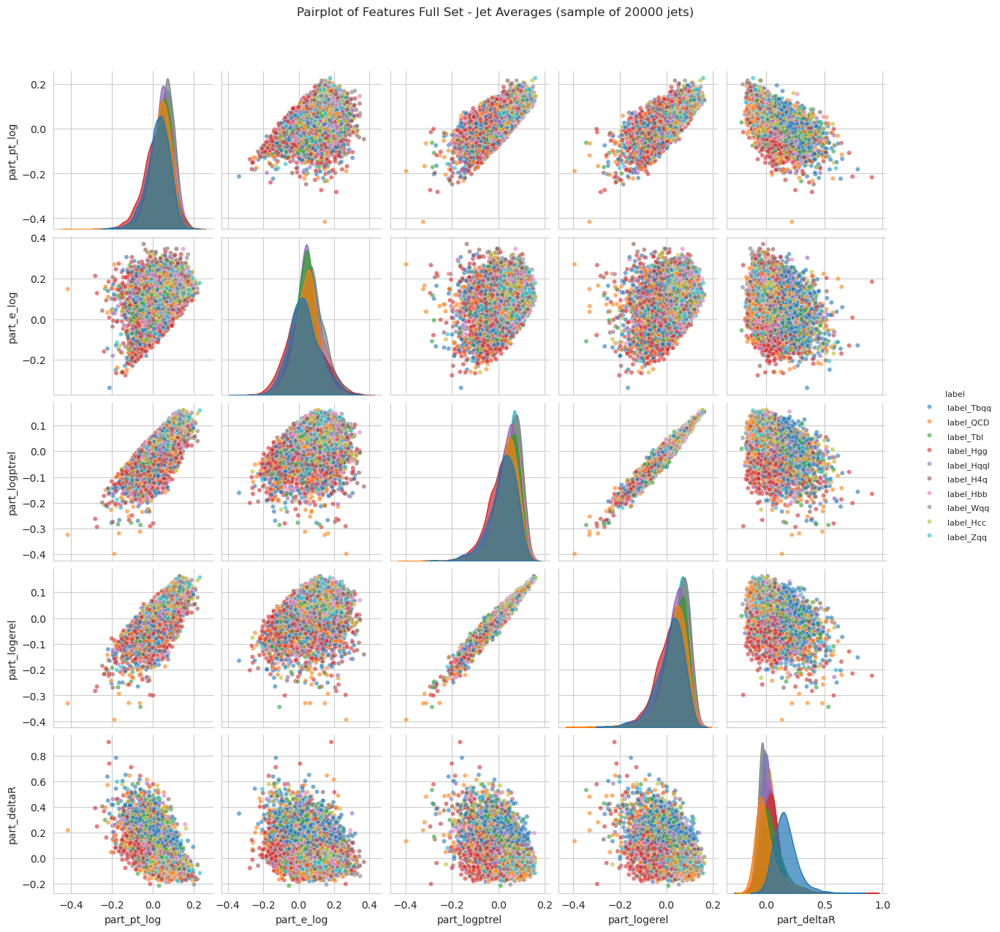

In [102]:
# Ejemplo de uso de la función modificada
# Definir features específicos para el pairplot
features_full = ['part_pt_log', 'part_e_log', 'part_logptrel', 'part_logerel', 'part_deltaR']

# Crear el pairplot con promedios por jet (20% de los 100k jets = 20,000 jets)
create_pf_features_pairplot_efficient(path_file, name='Features Full', 
features_subset=features_full, sample_size=20000)


Creando pairplot con 4 features (promedio por jet, muestra de 5000 jets)
Muestreando 5000 jets de 100000 total
DataFrame creado con 5000 jets y 4 features


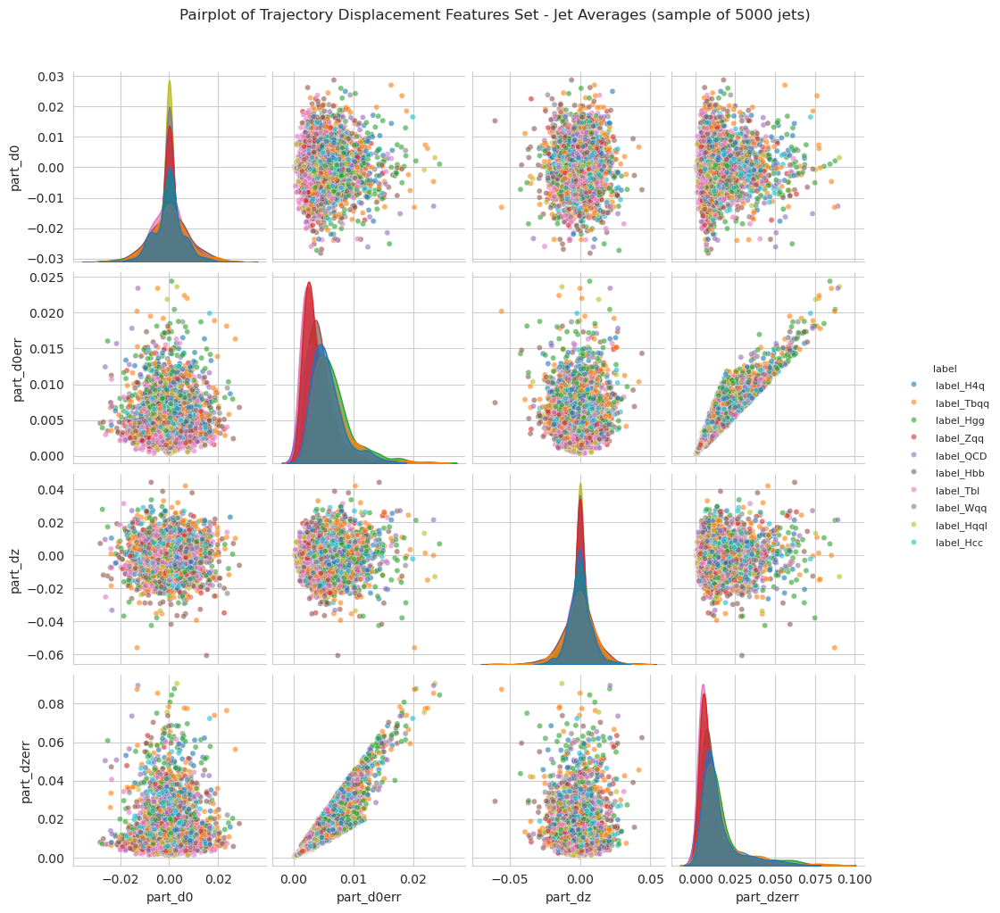

In [103]:
create_pf_features_pairplot_efficient(path_file, name = 'Trajectory Displacement Features', 
features_subset=features_traj_disp, sample_size=5000)

In [104]:
# Función modificada para filtrar por labels específicos en histogramas
def hist_feature_comparison_subplots_advanced_build(features_list, path_file, bins=100, alpha=0.5, labels_filter=None):
    """
    Genera histogramas con opciones personalizables y filtro de labels
    
    Args:
        features_list: lista de features a graficar
        path_file: ruta para guardar la imagen
        bins: número de bins para los histogramas
        alpha: transparencia de los histogramas
        labels_filter: lista de labels específicos a incluir (ej: ['label_QCD', 'label_Wqq'])
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            # Verificar si el label existe en el table usando hasattr
            if hasattr(table, label):
                # Convertir a numpy array para evitar problemas de compatibilidad
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Aplicar filtro a los labels
        filtered_labels = []
        for i in range(len(table)):
            if label_mask[i]:
                for label in labels_filter:
                    if hasattr(table, label) and np.array(table[label])[i] == 1:
                        filtered_labels.append(label.replace('label_', ''))  # Quitar prefijo
                        break
        
        labels = np.array(filtered_labels)
        unique_labels = np.unique(labels)
        
        print(f"Datos filtrados: {len(labels)} muestras")
        print(f"Labels únicos: {unique_labels}")
        
    else:
        # Sin filtro - usar todos los datos
        labels = table["labels"]
        unique_labels = np.unique(labels)
        print(f"Datos completos: {len(labels)} muestras")
    
    # Crear figura con subplots 2x4
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    # Colores para las etiquetas
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for i, feature in enumerate(features_list):
        if i >= 8:
            break
            
        ax = axes[i]
        
        # Aplicar filtro a los datos de features si se especifica
        if labels_filter is not None:
            jet_feat = np.array(table[feature])[label_mask]
        else:
            jet_feat = table[feature]
        
        for j, label in enumerate(unique_labels):
            mask = labels == label
            count = len(jet_feat[mask])
            print(f"{feature} - {label}: {count} eventos")
            ax.hist(jet_feat[mask], bins=bins, alpha=alpha, 
                   label=str(label), color=colors[j])
        
        ax.set_xlabel(feature)
        ax.set_ylabel('count')
        
        # Personalizar el título
        title_suffix = f"\n Labels: {', '.join(labels_filter).replace('label_', '')}" if labels_filter else ""
        ax.set_title(f'Histogram of {feature}{title_suffix}')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Rotar etiquetas del eje x si son muy largas
        if len(feature) > 10:
            ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    
    # Guardar con sufijo que indica qué labels se usaron
    filename_suffix = f"_{'_'.join(labels_filter).replace('label_', '')}" if labels_filter else ""
    plt.savefig(f"{path_file}/all_features_hist_subplots_advanced{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()


In [241]:
def create_pf_features_histograms_efficient(path_file, features_subset=None, sample_size=20000):
    """
    Crea histogramas eficientes promediando features por jet y muestreando jets
    """
    import matplotlib.pyplot as plt
    import pandas as pd
    
    features_and_labels = build_features_and_labels(tree)
    features = features_and_labels['pf_features']
    labels = table["labels"]
    
    feature_indices = {
        'part_pt_log': 0, 'part_e_log': 1, 'part_logptrel': 2, 'part_logerel': 3,
        'part_deltaR': 4, 'part_charge': 5, 'part_isChargedHadron': 6, 'part_isNeutralHadron': 7,
        'part_isPhoton': 8, 'part_isElectron': 9, 'part_isMuon': 10, 'part_d0': 11,
        'part_d0err': 12, 'part_dz': 13, 'part_dzerr': 14, 'part_deta': 15, 'part_dphi': 16
    }
    
    if features_subset is None:
        features_to_plot = list(feature_indices.keys())
    else:
        features_to_plot = [f for f in features_subset if f in feature_indices]
    
    print(f"Creando histogramas con {len(features_to_plot)} features (promedio por jet, muestra de {sample_size} jets)")
    
    # Crear DataFrame con promedios por jet
    data_dict = {}
    
    # Muestrear jets si hay demasiados
    total_jets = len(features)
    if total_jets > sample_size:
        jet_indices = np.random.choice(total_jets, size=sample_size, replace=False)
        print(f"Muestreando {sample_size} jets de {total_jets} total")
    else:
        jet_indices = np.arange(total_jets)
        print(f"Usando todos los {total_jets} jets")
    
    # Calcular promedios para cada feature por jet
    for feature in features_to_plot:
        idx = feature_indices[feature]
        feature_averages = []
        feature_labels = []
        
        for jet_idx in jet_indices:
            # Obtener todas las partículas del jet para esta feature
            jet_feature_data = features[jet_idx][idx, :]  # Shape: (n_particles,)
            
            # Calcular promedio (ignorando valores NaN o cero si es necesario)
            # Para features como charge, isChargedHadron, etc., el promedio tiene sentido
            # Para features logarítmicos, también es válido
            jet_average = np.mean(jet_feature_data)
            
            feature_averages.append(jet_average)
            feature_labels.append(str(labels[jet_idx]))
        
        data_dict[feature] = feature_averages
    
    data_dict['label'] = feature_labels
    df = pd.DataFrame(data_dict)
    
    print(f"DataFrame creado con {len(df)} jets y {len(features_to_plot)} features")
    
    # Crear histogramas en lugar de pairplot
    n_features = len(features_to_plot)
    if n_features <= 8:
        rows, cols = 2, 4
    elif n_features <= 12:
        rows, cols = 3, 4
    else:
        rows, cols = 4, 4
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5*rows))
    axes = axes.flatten()
    
    # Obtener labels únicos y colores
    unique_labels = df['label'].unique()
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for i, feature in enumerate(features_to_plot):
        if i >= len(axes):
            break
            
        ax = axes[i]
        
        for j, label in enumerate(['label_QCD', 'label_Wqq']):
            mask = df['label'] == label
            data = df[mask][feature]

            # all_dr = df[mask]['part_deltaR'].values
            # all_pt = df[mask]['part_pt_log'].values


            # if len(all_dr) > 0:
            #         # Crear histograma ponderado por pT
            #         hist, bin_edges = np.histogram(all_dr, bins=50, range=(0, 1), weights=all_pt)
                    
            #         # Normalizar por el número de jets de esta clase
            #         n_jets = len([idx for idx in jet_indices 
            #                     if ['label_QCD', 'label_Wqq'] and hasattr(table, label) and np.array(table[label])[idx] == 1])
            #         if n_jets == 0:
            #             n_jets = len(jet_indices)
                    
            #         hist_normalized = hist / n_jets
                    
            #         # Calcular centros de bins
            #         bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
                    
            #         # Graficar perfil radial
            #         ax.plot(bin_centers, hist_normalized, 
            #             label=f'{label.replace("label_", "")} (n={n_jets})', 
            #             color=colors[i], linewidth=2.5, alpha=0.8)
                    
            #         # También agregar área sombreada
            #         ax.fill_between(bin_centers, hist_normalized, alpha=0.3, color=colors[i])
                    
            #         print(f"{label.replace('label_', '')}: {n_jets} jets, {len(all_dr)} particles")
            
            # ax.set_xlabel('ΔR (Radial Distance)', fontsize=12)
            # ax.set_ylabel('Average pT per jet', fontsize=12)
            # ax.set_title('Radial Energy Profiles by Jet Class', fontsize=14, fontweight='bold')
            # ax.legend(fontsize=10)
            # ax.grid(True, alpha=0.3)
            # ax.set_xlim(0, 1)

            ax.hist(data, bins=50, alpha=0.6, label=str(label), color=colors[j])
        
        ax.set_xlabel(feature, fontsize=10)
        ax.set_ylabel('count', fontsize=10)
        ax.set_title(f'Histogram of {feature}', fontsize=12)
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Ocultar axes vacíos
    for i in range(len(features_to_plot), len(axes)):
        axes[i].set_visible(False)
    
    plt.tight_layout()
    
    plt.savefig(f"{path_file}/pf_features_histograms_jet_averages.png", dpi=300, bbox_inches='tight')
    plt.show()

Creando histogramas con 2 features (promedio por jet, muestra de 20000 jets)
Muestreando 20000 jets de 100000 total
DataFrame creado con 20000 jets y 2 features


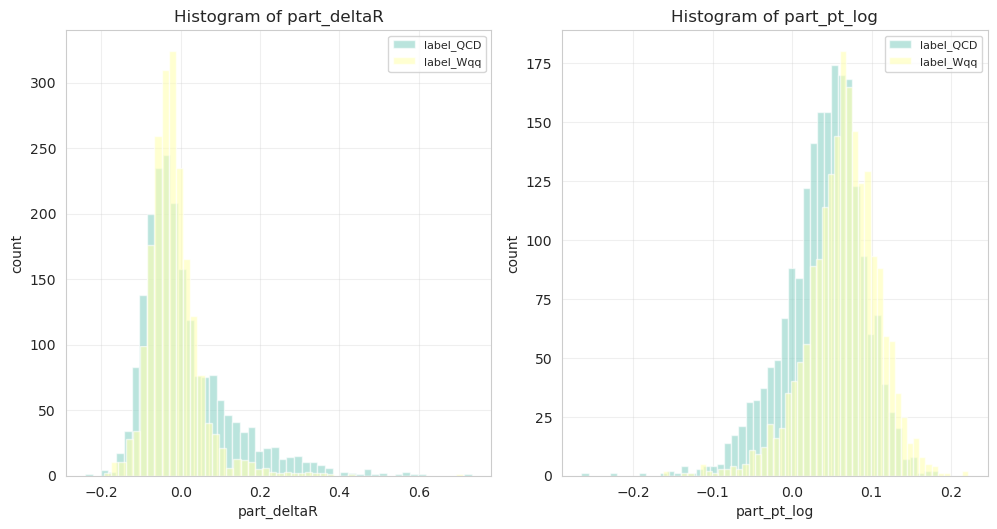

In [ ]:
# 5. Análisis detallado con muchas features
kinematic_features = ['part_pt_log', 'part_']
track_features = ['part_d0', 'part_dz', 'part_dz', 'part_dzerr']


# 3. Solo algunas features importantes con configuración personalizada
create_pf_features_histograms_efficient(
    path_file=path_file, 
    features_subset=kinematic_features,
    sample_size=20000,
)



In [231]:
def create_d0_dz_histograms(path_file, labels_filter=None, bins=50, sample_size=None):
    """
    Crea histogramas de d0/d0err y dz/dzerr para cada clase de jet usando table directamente
    
    Args:
        path_file: ruta para guardar las imágenes
        labels_filter: lista de labels específicos a incluir (ej: ['QCD', 'Wqq'])
        bins: número de bins para los histogramas
        sample_size: número de jets a muestrear (None para usar todos)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Obtener nombres de clases
    class_names = ['QCD', 'Hbb', 'Hcc', 'Hgg', 'Hqql', 'H4q', 'Htautau', 'Zqq', 'Wqq', 'Zll', 'Wll']
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Convertir nombres de clases a formato de labels de table si es necesario
        if isinstance(labels_filter[0], str):
            # Si son strings, convertir a formato 'label_ClassName'
            label_names = []
            for class_name in labels_filter:
                if class_name in class_names:
                    label_names.append(f'label_{class_name}')
                else:
                    print(f"Advertencia: Clase '{class_name}' no encontrada. Clases disponibles: {class_names}")
            labels_filter = label_names
            print(f"Labels convertidos: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            if hasattr(table, label):
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Obtener índices de jets filtrados
        filtered_jet_indices = np.where(label_mask)[0]
        print(f"Datos filtrados: {len(filtered_jet_indices)} jets")
        
    else:
        # Sin filtro - usar todos los datos
        filtered_jet_indices = np.arange(len(table))
        print(f"Datos completos: {len(filtered_jet_indices)} jets")
    
    # Muestreo si se especifica
    if sample_size is not None and len(filtered_jet_indices) > sample_size:
        np.random.seed(42)  # Para reproducibilidad
        filtered_jet_indices = np.random.choice(filtered_jet_indices, size=sample_size, replace=False)
        print(f"Muestreando {sample_size} jets de {len(filtered_jet_indices)} disponibles")
    
    # Crear figura con subplots 1x2 (solo promediar primero)
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Colores para las etiquetas
    n_classes = len(labels_filter) if labels_filter else len(class_names)
    colors = plt.cm.Set3(np.linspace(0, 1, n_classes))
    
    # Procesar cada label
    labels_to_process = labels_filter if labels_filter else [f'label_{name}' for name in class_names]
    
    for i, label in enumerate(labels_to_process):
        if i >= n_classes:
            continue
            
        class_name = label.replace('label_', '')
        
        # Recopilar datos para esta clase - Solo promediar primero
        all_d0_ratio = []
        all_dz_ratio = []
        
        for jet_idx in filtered_jet_indices:
            # Verificar si este jet pertenece a la clase actual
            if hasattr(table, label) and np.array(table[label])[jet_idx] == 1:
                # Obtener datos de partículas de este jet
                jet_d0val = np.array(table['part_d0val'][jet_idx])
                jet_d0err = np.array(table['part_d0err'][jet_idx])
                jet_dzval = np.array(table['part_dzval'][jet_idx])
                jet_dzerr = np.array(table['part_dzerr'][jet_idx])
                
                # Calcular d0 y dz usando tanh (como en las definiciones)
                jet_d0 = np.tanh(jet_d0val)
                jet_dz = np.tanh(jet_dzval)
                
                # Filtrar partículas válidas (d0val != 0 y d0err > 0 indica partícula real)
                valid_particles = (jet_d0val != 0) & (jet_d0err > 0) & (jet_dzerr > 0)
                jet_d0 = jet_d0[valid_particles]
                jet_d0err = jet_d0err[valid_particles]
                jet_dz = jet_dz[valid_particles]
                jet_dzerr = jet_dzerr[valid_particles]

                #jet_d0_val = jet_d0val[valid_particles]
                #jet_dz_val = jet_dzval[valid_particles]
                
                if len(jet_d0) > 0:  # Solo si hay partículas válidas
                    # Promediar d0 y d0err por jet, luego calcular razón
                    avg_d0 = np.mean(jet_d0)
                    avg_d0err = np.mean(jet_d0err)
                    avg_dz = np.mean(jet_dz)
                    avg_dzerr = np.mean(jet_dzerr)


                    
                    d0_ratio = avg_d0 / avg_d0err
                    dz_ratio = avg_dz / avg_dzerr
                    
                    all_d0_ratio.append(d0_ratio)
                    all_dz_ratio.append(dz_ratio)
        
        # Convertir a arrays
        all_d0_ratio = np.array(all_d0_ratio)
        all_dz_ratio = np.array(all_dz_ratio)
        
        if len(all_d0_ratio) > 0:
            # Histogramas con escala log
            axes[0].hist(all_d0_ratio, bins=bins, alpha=0.8, 
                        label=f'{class_name} (n={len(all_d0_ratio)})', 
                        color=colors[i], density=True)
            axes[1].hist(all_dz_ratio, bins=bins, alpha=0.8, 
                        label=f'{class_name} (n={len(all_dz_ratio)})', 
                        color=colors[i], density=True)
            
            print(f"{class_name}: {len(all_d0_ratio)} jets válidos")
        else:
            print(f"{class_name}: No se encontraron jets válidos")
    
    # Configurar subplots y aplicar escala log
    titles = ['d0/d0err', 'dz/dzerr']
    
    for i, (ax, title) in enumerate(zip(axes, titles)):
        ax.set_title(title, fontsize=12)
        ax.set_xlabel('Significance of displacement', fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        #ax.set_xscale('log')  # Aplicar escala log en y
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Guardar
    filename_suffix = f"_{'_'.join([l.replace('label_', '') for l in labels_filter])}" if labels_filter else ""
    sample_suffix = f"_sample{sample_size}" if sample_size else ""
    plt.savefig(f"{path_file}/d0_dz_ratios_histograms{filename_suffix}{sample_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    return fig


In [237]:
path_file

'/home/catalinariano/Descargas/Documentos/particle_transformer-main/notebooks/EDA_plots/d0_dz_histograms'

=== EJEMPLOS DE USO ===

--- Ejemplo 1: QCD vs Hbb vs Wqq ---
Filtrando por labels: ['QCD', 'Hbb', 'Wqq']
Labels convertidos: ['label_QCD', 'label_Hbb', 'label_Wqq']
Datos filtrados: 30000 jets
QCD: 9998 jets válidos
Hbb: 10000 jets válidos
Wqq: 10000 jets válidos


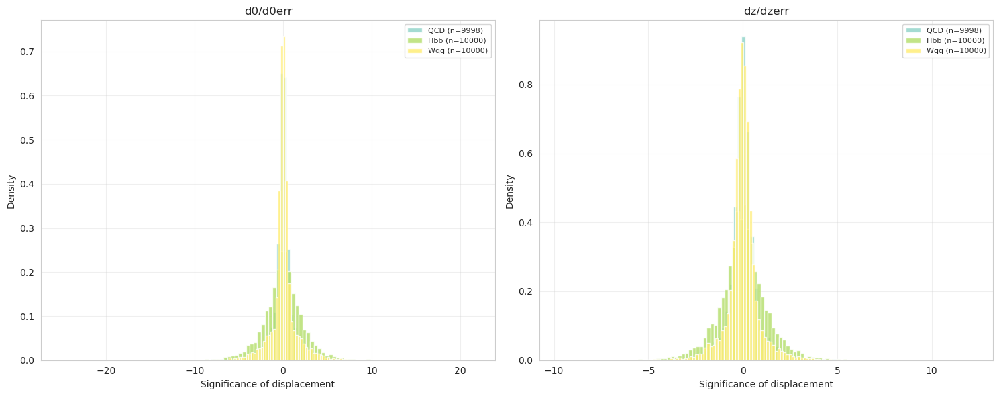

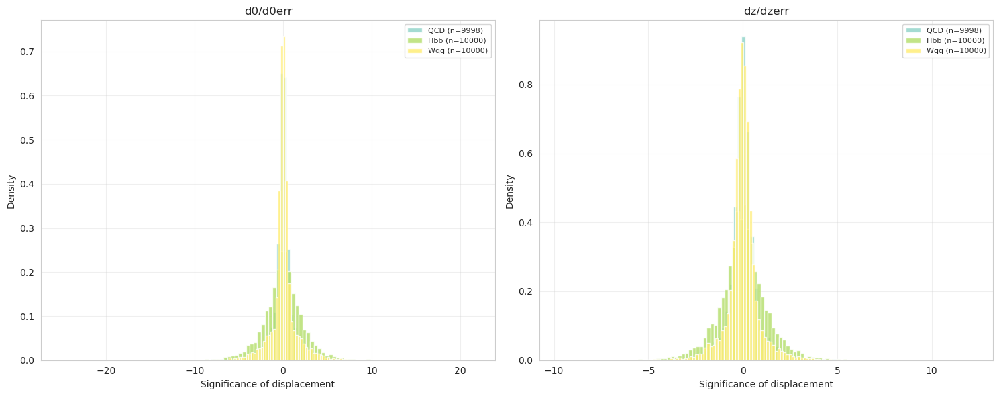

In [236]:
# EJEMPLO DE USO DE LA FUNCIÓN DE HISTOGRAMAS d0/dz
print("=== EJEMPLOS DE USO ===")
path_file = os.getcwd() + os.sep + 'EDA_plots' + os.sep + "d0_dz_histograms"
import os
if not os.path.exists(path_file):
    os.makedirs(path_file)

# Ejemplo 1: Histogramas para QCD vs Wqq con muestreo
print("\n--- Ejemplo 1: QCD vs Hbb vs Wqq ---")
create_d0_dz_histograms(path_file, labels_filter=['QCD', 'Hbb', 'Wqq'],bins = 100, sample_size=30000)


In [243]:
def create_d0_d0err_profiles(path_file, labels_filter=None, bins=50, plot_type='hist2d'):
    """
    Crea perfiles de relación entre d0 y d0err para cada clase de jet
    Similar al perfil radial de energía pero mostrando d0 vs d0err
    
    Args:
        path_file: ruta para guardar las imágenes
        labels_filter: lista de labels específicos a incluir (ej: ['QCD', 'Wqq'])
        bins: número de bins para el histograma
        plot_type: 'hist2d' para histograma 2D, 'scatter' para scatter plot
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Obtener nombres de clases
    class_names = ['QCD', 'Hbb', 'Hcc', 'Hgg', 'Hqql', 'H4q', 'Htautau', 'Zqq', 'Wqq', 'Zll', 'Wll']
    
    # Filtrar por labels específicos si se especifica
    if labels_filter is not None:
        print(f"Filtrando por labels: {labels_filter}")
        
        # Convertir nombres de clases a formato de labels de table si es necesario
        if isinstance(labels_filter[0], str):
            # Si son strings, convertir a formato 'label_ClassName'
            label_names = []
            for class_name in labels_filter:
                if class_name in class_names:
                    label_names.append(f'label_{class_name}')
                else:
                    print(f"Advertencia: Clase '{class_name}' no encontrada. Clases disponibles: {class_names}")
            labels_filter = label_names
            print(f"Labels convertidos: {labels_filter}")
        
        # Crear máscara para los labels deseados
        label_mask = np.zeros(len(table), dtype=bool)
        for label in labels_filter:
            if hasattr(table, label):
                label_data = np.array(table[label])
                label_mask |= (label_data == 1)
        
        # Obtener índices de jets filtrados
        filtered_jet_indices = np.where(label_mask)[0]
        print(f"Datos filtrados: {len(filtered_jet_indices)} jets")
        
    else:
        # Sin filtro - usar todos los datos
        filtered_jet_indices = np.arange(len(table))
        print(f"Datos completos: {len(filtered_jet_indices)} jets")
    
    # Crear figura
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    # Colores para las etiquetas
    n_classes = len(labels_filter) if labels_filter else len(class_names)
    colors = plt.cm.Set3(np.linspace(0, 1, n_classes))
    
    # Procesar cada label
    labels_to_process = labels_filter if labels_filter else [f'label_{name}' for name in class_names]
    
    for i, label in enumerate(labels_to_process):
        if i >= n_classes:
            continue
            
        class_name = label.replace('label_', '')
        
        # Recopilar datos para esta clase específica
        all_d0 = []
        all_d0err = []
        
        for jet_idx in filtered_jet_indices:
            # Verificar si este jet pertenece a la clase actual
            if hasattr(table, label) and np.array(table[label])[jet_idx] == 1:
                # Obtener datos de partículas de este jet
                jet_d0val = np.array(table['part_d0val'][jet_idx])
                jet_d0err = np.array(table['part_d0err'][jet_idx])
                
                # Calcular d0 usando tanh
                jet_d0 = np.tanh(jet_d0val)
                
                # Filtrar partículas válidas (d0val != 0 y d0err > 0 indica partícula real)
                valid_particles = (jet_d0val != 0) & (jet_d0err > 0)
                jet_d0_valid = jet_d0[valid_particles]
                jet_d0err_valid = jet_d0err[valid_particles]
                
                all_d0.extend(jet_d0_valid)
                all_d0err.extend(jet_d0err_valid)
        
        all_d0 = np.array(all_d0)
        all_d0err = np.array(all_d0err)
        
        if len(all_d0) > 0:
            if plot_type == 'hist2d':
                # Histograma 2D
                hist, xedges, yedges = np.histogram2d(all_d0, all_d0err, bins=bins)
                extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
                
                im = ax.imshow(hist.T, extent=extent, origin='lower', 
                              cmap=plt.cm.viridis, alpha=0.7)
                ax.set_xlabel('d0 = tanh(d0val)', fontsize=12)
                ax.set_ylabel('d0err', fontsize=12)
                
            elif plot_type == 'scatter':
                # Scatter plot con muestreo si hay demasiados puntos
                if len(all_d0) > 10000:
                    indices = np.random.choice(len(all_d0), 10000, replace=False)
                    d0_sample = all_d0[indices]
                    d0err_sample = all_d0err[indices]
                else:
                    d0_sample = all_d0
                    d0err_sample = all_d0err
                
                ax.scatter(d0_sample, d0err_sample, alpha=0.6, s=1, 
                          color=colors[i], label=f'{class_name} (n={len(all_d0)})')
                ax.set_xlabel('d0 = tanh(d0val)', fontsize=12)
                ax.set_ylabel('d0err', fontsize=12)
                ax.legend(fontsize=10)
            
            print(f"{class_name}: {len(all_d0)} partículas válidas")
        else:
            print(f"{class_name}: No se encontraron partículas válidas")
    
    # Configurar gráfico
    ax.set_title('Relationship betwwen d0 and d0err by Jet Class', fontsize=12)
    ax.grid(True, alpha=0.3)
    
    if plot_type == 'hist2d':
        plt.colorbar(im, ax=ax, label='Number of particles')
    
    plt.tight_layout()
    
    # Guardar
    filename_suffix = f"_{'_'.join([l.replace('label_', '') for l in labels_filter])}" if labels_filter else ""
    plt.savefig(f"{path_file}/d0_d0err_profiles_{plot_type}{filename_suffix}.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    return fig


=== EJEMPLOS DE USO ===

--- Ejemplo 1: Histograma 2D QCD vs Wqq ---
Filtrando por labels: ['QCD', 'Wqq']
Labels convertidos: ['label_QCD', 'label_Wqq']
Datos filtrados: 20000 jets
QCD: 172830 partículas válidas
Wqq: 157419 partículas válidas


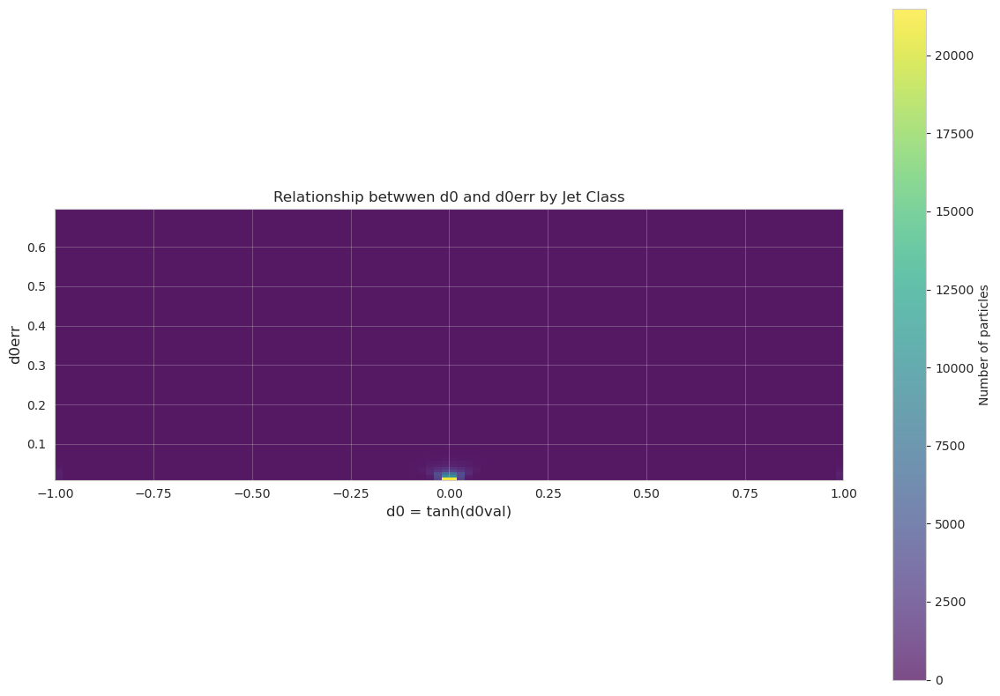


--- Ejemplo 2: Scatter plot QCD, Hbb, Wqq ---
Filtrando por labels: ['QCD', 'Hbb', 'Wqq']
Labels convertidos: ['label_QCD', 'label_Hbb', 'label_Wqq']
Datos filtrados: 30000 jets
QCD: 172830 partículas válidas
Hbb: 203020 partículas válidas
Wqq: 157419 partículas válidas


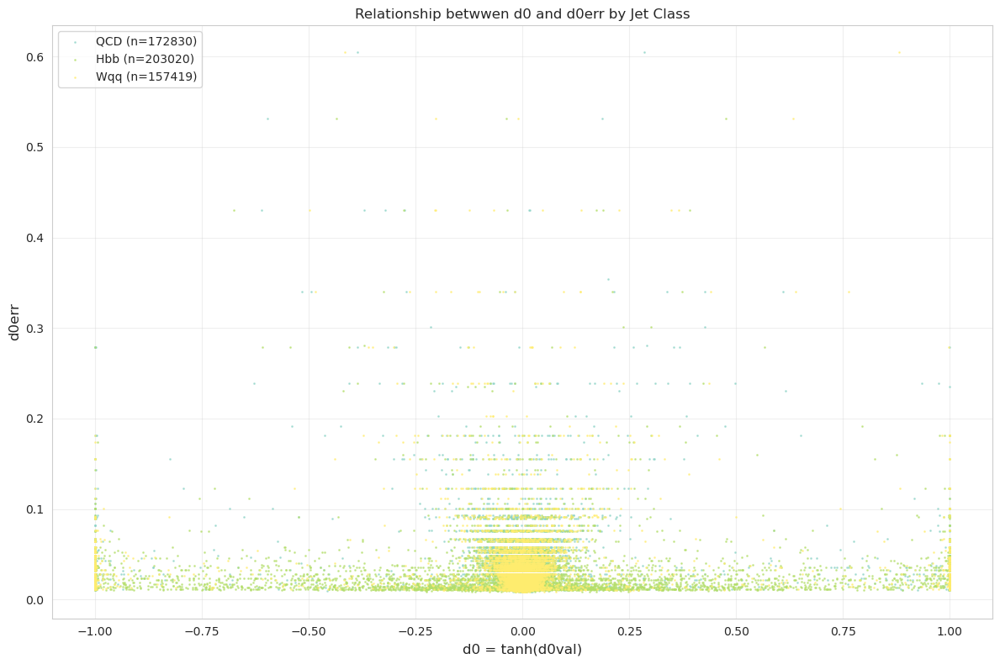

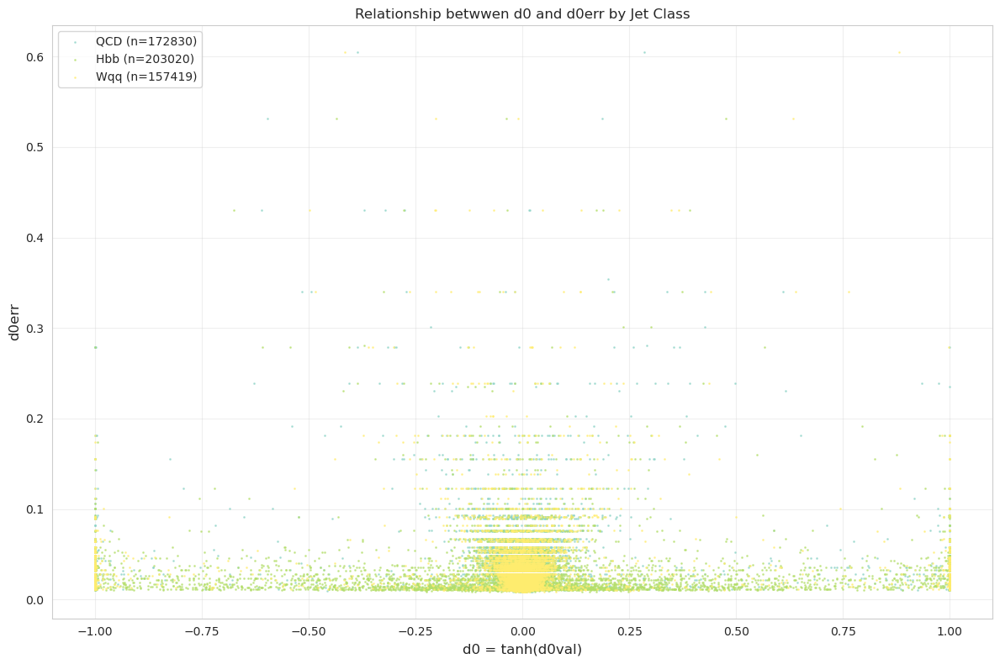

In [244]:
# EJEMPLO DE USO DE LA FUNCIÓN DE PERFILES d0 vs d0err
print("=== EJEMPLOS DE USO ===")
path_file = "graficos/d0_d0err_profiles"
import os
if not os.path.exists(path_file):
    os.makedirs(path_file)

# Ejemplo 1: Histograma 2D para QCD vs Wqqbins = 100
print("\n--- Ejemplo 1: Histograma 2D QCD vs Wqq ---")
create_d0_d0err_profiles(path_file, labels_filter=['QCD', 'Wqq'], bins = 100, plot_type='hist2d')

# Ejemplo 2: Scatter plot para múltiples clases
print("\n--- Ejemplo 2: Scatter plot QCD, Hbb, Wqq ---")
create_d0_d0err_profiles(path_file, labels_filter=['QCD', 'Hbb', 'Wqq'], plot_type='scatter')


Creando histogramas con 4 features (promedio por jet, muestra de 20000 jets)
Muestreando 20000 jets de 100000 total
DataFrame creado con 20000 jets y 4 features


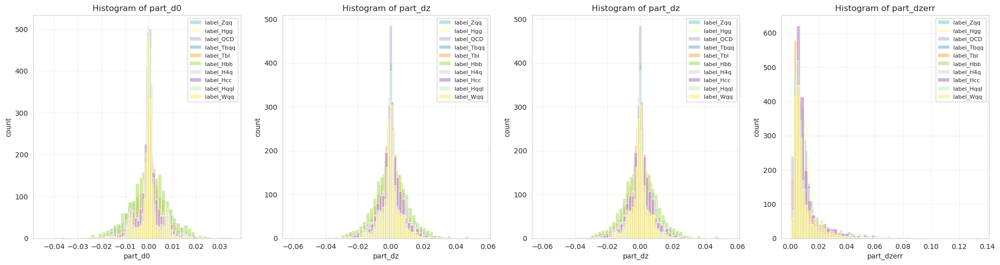

In [113]:
# 3. Solo algunas features importantes con configuración personalizada
create_pf_features_histograms_efficient(
    path_file=path_file,
    features_subset=track_features,
    sample_size=20000,
    #bins=50,
    #alpha=0.6,
    #labels_filter=['label_QCD', 'label_Wqq']
)

In [115]:
def create_pf_features_kde_efficient(path_file, features_subset=None, sample_size=20000):
    """
    Crea KDE plots eficientes promediando features por jet y muestreando jets
    """
    import matplotlib.pyplot as plt
    import pandas as pd
    import seaborn as sns
    
    features_and_labels = build_features_and_labels(tree)
    features = features_and_labels['pf_features']
    labels = table["labels"]
    
    feature_indices = {
        'part_pt_log': 0, 'part_e_log': 1, 'part_logptrel': 2, 'part_logerel': 3,
        'part_deltaR': 4, 'part_charge': 5, 'part_isChargedHadron': 6, 'part_isNeutralHadron': 7,
        'part_isPhoton': 8, 'part_isElectron': 9, 'part_isMuon': 10, 'part_d0': 11,
        'part_d0err': 12, 'part_dz': 13, 'part_dzerr': 14, 'part_deta': 15, 'part_dphi': 16
    }
    
    if features_subset is None:
        features_to_plot = list(feature_indices.keys())
    else:
        features_to_plot = [f for f in features_subset if f in feature_indices]
    
    print(f"Creando KDE plots con {len(features_to_plot)} features (promedio por jet, muestra de {sample_size} jets)")
    
    # Crear DataFrame con promedios por jet
    data_dict = {}
    
    # Muestrear jets si hay demasiados
    total_jets = len(features)
    if total_jets > sample_size:
        jet_indices = np.random.choice(total_jets, size=sample_size, replace=False)
        print(f"Muestreando {sample_size} jets de {total_jets} total")
    else:
        jet_indices = np.arange(total_jets)
        print(f"Usando todos los {total_jets} jets")
    
    # Calcular promedios para cada feature por jet
    for feature in features_to_plot:
        idx = feature_indices[feature]
        feature_averages = []
        feature_labels = []
        
        for jet_idx in jet_indices:
            # Obtener todas las partículas del jet para esta feature
            jet_feature_data = features[jet_idx][idx, :]  # Shape: (n_particles,)
            
            # Calcular promedio (ignorando valores NaN o cero si es necesario)
            # Para features como charge, isChargedHadron, etc., el promedio tiene sentido
            # Para features logarítmicos, también es válido
            jet_average = np.mean(jet_feature_data)
            
            feature_averages.append(jet_average)
            feature_labels.append(str(labels[jet_idx]))
        
        data_dict[feature] = feature_averages
    
    data_dict['label'] = feature_labels
    df = pd.DataFrame(data_dict)
    
    print(f"DataFrame creado con {len(df)} jets y {len(features_to_plot)} features")
    
    # Crear KDE plots en lugar de histogramas
    n_features = len(features_to_plot)
    if n_features <= 8:
        rows, cols = 2, 4
    elif n_features <= 12:
        rows, cols = 3, 4
    else:
        rows, cols = 4, 4
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5*rows))
    axes = axes.flatten()
    
    # Obtener labels únicos y colores
    unique_labels = df['label'].unique()
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for i, feature in enumerate(features_to_plot):
        if i >= len(axes):
            break
            
        ax = axes[i]
        
        for j, label in enumerate(unique_labels):
            subset = df[df['label'] == label]
            data = subset[feature]
            
            # Verificar que hay suficientes datos para KDE
            if len(data) > 5:
                sns.kdeplot(data=data, ax=ax, label=str(label), 
                           color=colors[j], alpha=0.7, linewidth=2.5)
                
                # Agregar área sombreada
                sns.kdeplot(data=data, ax=ax, 
                           color=colors[j], alpha=0.3, fill=True)
        
        ax.set_xlabel(feature, fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        ax.set_title(f'KDE of {feature}', fontsize=12)
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Ocultar axes vacíos
    for i in range(len(features_to_plot), len(axes)):
        axes[i].set_visible(False)
    
    #fig.suptitle(f'KDE Plots of {name} Set - Jet Averages (sample of {len(df)} jets)', 
    #             y=0.98, fontsize=16)
    plt.tight_layout()
    
    plt.savefig(f"{path_file}/pf_features__kde_jet_averages.png", dpi=300, bbox_inches='tight')
    plt.show()


Creando KDE plots con 2 features (promedio por jet, muestra de 20000 jets)
Muestreando 20000 jets de 100000 total
DataFrame creado con 20000 jets y 2 features


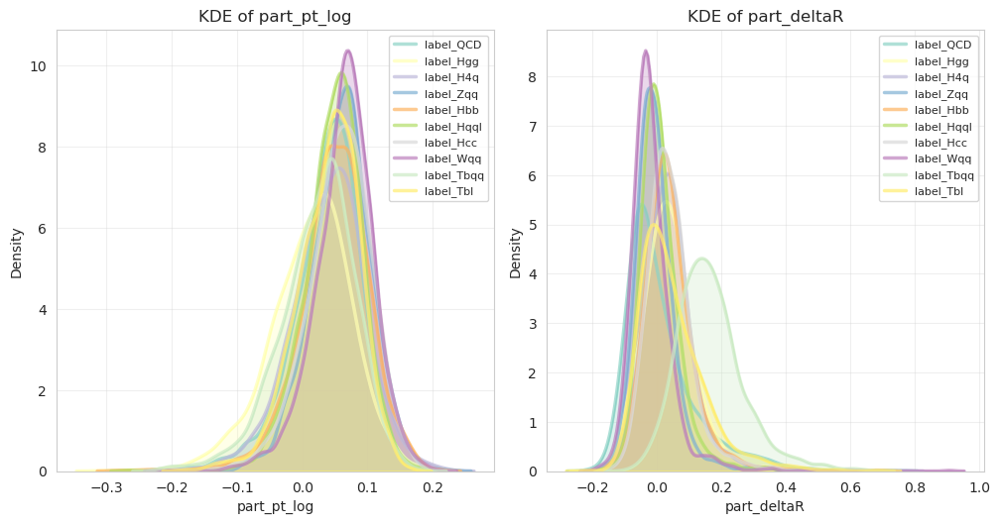

In [116]:
# Con subset de features
create_pf_features_kde_efficient(
    path_file, 
    features_subset=['part_pt_log', 'part_deltaR']
)

Creando KDE plots con 2 features (promedio por jet, muestra de 20000 jets)
Muestreando 20000 jets de 100000 total
DataFrame creado con 20000 jets y 2 features


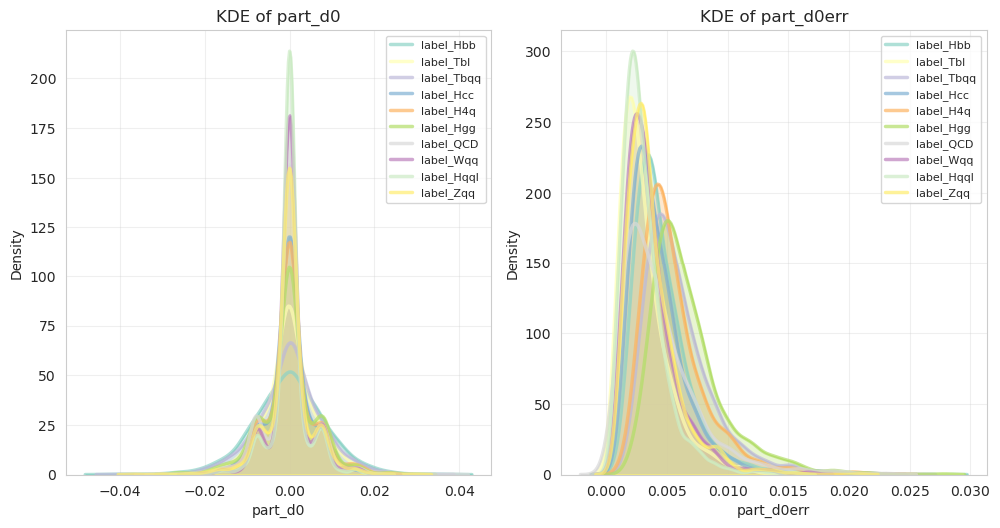

In [117]:
# Con subset de features
create_pf_features_kde_efficient(
    path_file,
    features_subset=['part_d0', 'part_d0err']
)